<h1><center>Dog breed Identification from images using CNN</center></h1>

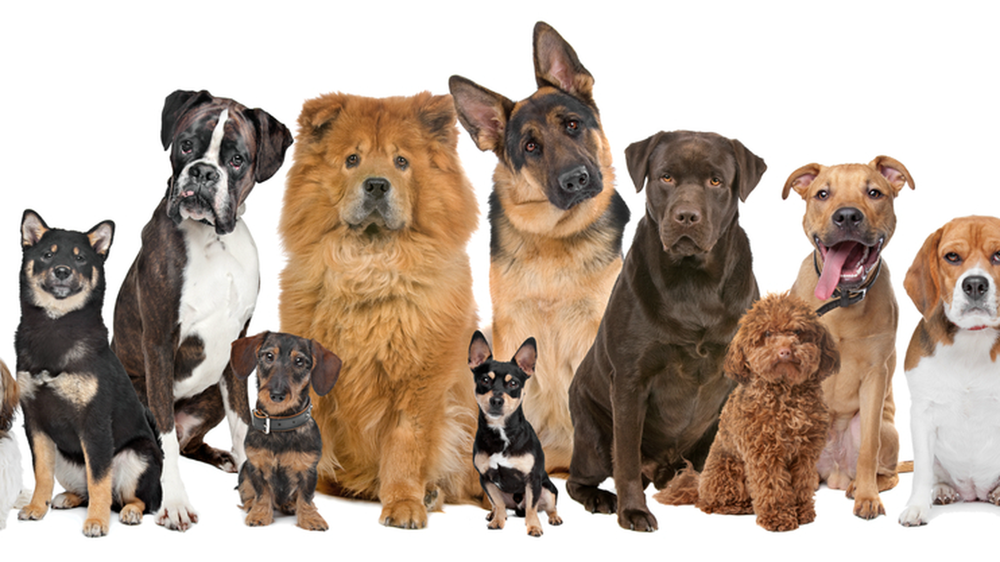

**The project's goal**

The objective of this Notebook is to detail the implementation of an algorithm for detecting the breed of the dog on a photo, in order to speed up the indexing work in a database.

**Constraints imposed:**

- Pre-process the images with specific techniques (e.g. whitening, equalization, possibly modifying the size of the images).
- Perform data augmentation (mirroring, cropping...).
- Implementation of 2 approaches to the use of CNNs:
    - Realize a CNN neural network from scratch by optimizing the parameters.
    - Use transfer learning and thus use an already trained network.

### Project Structure:

**1. Import the Libraries**

**2. Loading Data ad files**

**3. Visualize the data**

**4. Image Preprocessing**

**5: Modeling**

### 1. Import the Libraries

Here we importing some important libraries and the modules that are required for building the convolutional model. 

In [1]:
# load all required libraries for Dog's Breed Identification Project

import os
import matplotlib.pyplot as plt
import cv2 as cv
import PIL
import pathlib
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
import numpy as np
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.layers import Dropout, BatchNormalization
from tensorflow.keras.applications.resnet_v2 import preprocess_input
from keras_tuner import RandomSearch
import keras_tuner as kt
import warnings
warnings.filterwarnings('ignore')
import matplotlib.image as mpimg
import gradio as gr
%matplotlib inline

In [2]:
# check GPU devices
physical_devices = tf.config.experimental.list_physical_devices('GPU')
print('Num GPUs Available: ', len(physical_devices))

Num GPUs Available:  0


### 2. Loading data and files

Let’s talk about the dataset that we are used for training our CNN model, we used [Stanford Dogs Dataset.](http://vision.stanford.edu/aditya86/ImageNetDogs/)

The Stanford Dogs dataset contains images of 120 breeds of dogs from around the world. This dataset has been built using images and annotation from ImageNet for the task of fine-grained image categorization. Contents of this dataset:

- Number of categories: 120
- Number of images: 20,580
- Annotations: Class labels, Bounding boxes

In [3]:
# # importing the "tarfile" module
# import tarfile

# # open file
# file = tarfile.open('../../data_deep/doc_tar/images.tar')

# # extracting file
# file.extractall('../Data/input_dataset')

# file.close()

In [4]:
# Define path to data
images_dir = '../Data/input_dataset/Images'

Let’s check how many types of dog breeds are present in our dataset.

In [5]:
# Count the number of classes (dogs breeds)
breed_list = os.listdir(images_dir)

print('Total number of unique Dog Breeds:', len(breed_list))

Total number of unique Dog Breeds: 120


In [6]:
# # Rename of breed folders.
# for i in breed_list:
#     os.rename(images_dir + '/' + i, images_dir + '/' + i.split('-',
#               1)[1])

In [7]:
# Use pathlib librairie
data_dir = pathlib.Path(images_dir)
data_dir

WindowsPath('../Data/input_dataset/Images')

Let’s check how many images of dog breeds are present in our dataset.

In [8]:
# Count total images
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

20580


### 3. Visualize the data

Here are nine images from different breed's dog.:

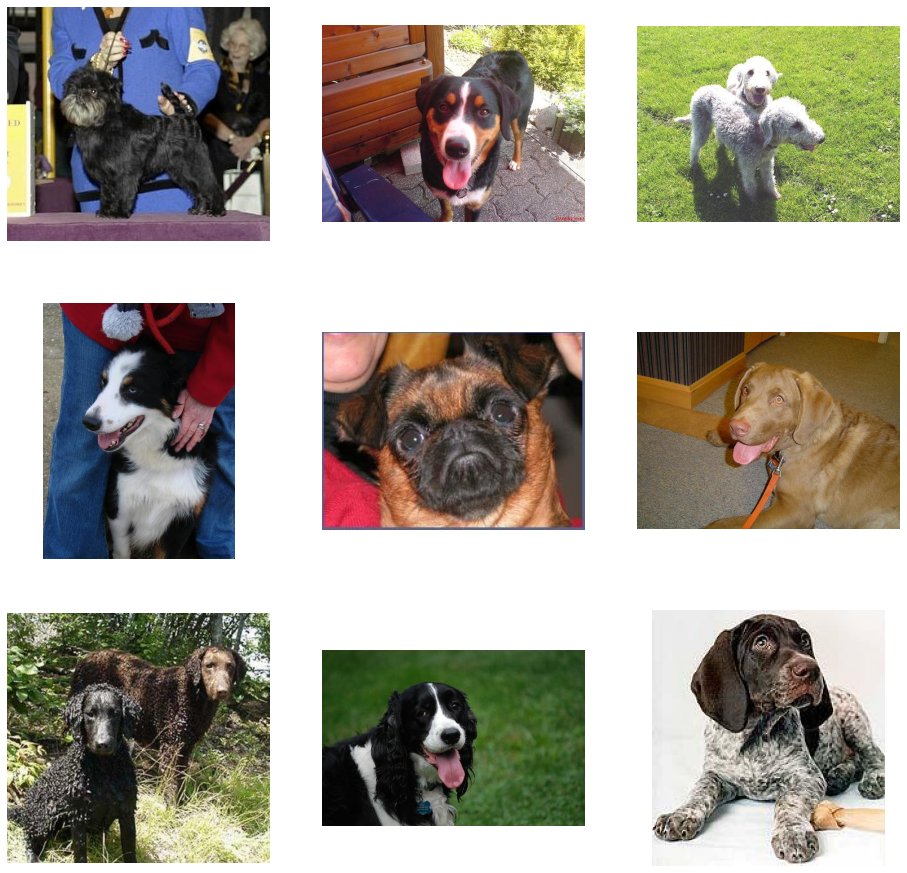

In [9]:
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    img_test = str(list(data_dir.glob('*/*.jpg'))[i * 1000])
    img_test = cv.imread(img_test)
    img_test = cv.cvtColor(img_test, cv.COLOR_BGR2RGB)
    plt.imshow(img_test)
    plt.axis('off')

Let’s check how many number of images for each dog breed in our dataset.

In [10]:
# Count number of pictures for each breed
breed_list = os.listdir(images_dir)
df_breeds = pd.DataFrame(index=[breed for breed in breed_list],
                         data=[len(os.listdir(images_dir + '/' + name))
                         for name in breed_list],
                         columns=['image_number'])

In [11]:
df_breeds.head()

,image_number
affenpinscher,150
Afghan_hound,239
African_hunting_dog,169
Airedale,202
American_Staffordshire_terrier,164


In [435]:
df_breeds.describe()

,image_number
count,120.000000
mean,171.500000
std,23.220898
min,148.000000
25%,152.750000
50%,159.500000
75%,186.250000
max,252.000000


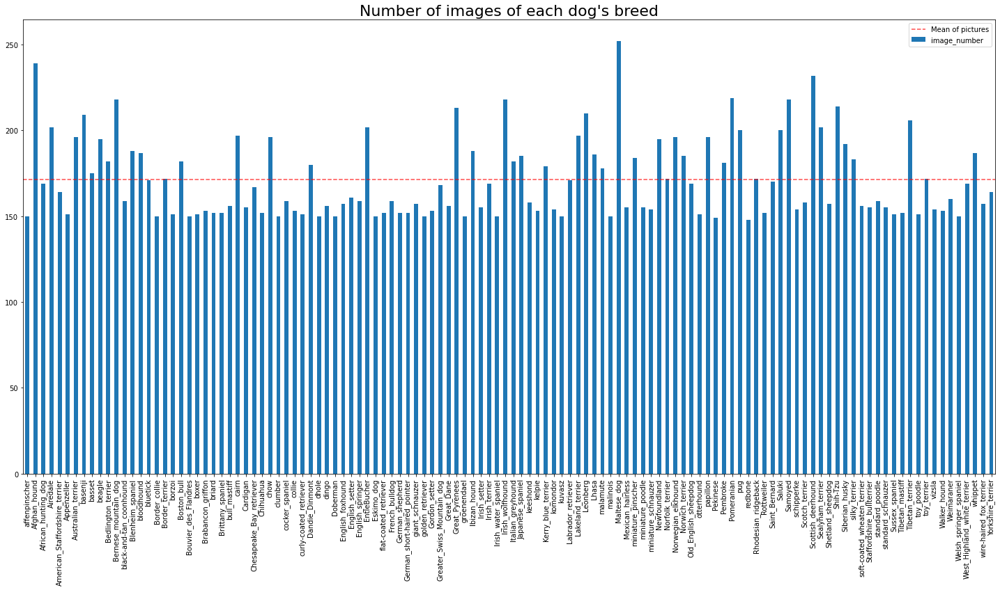

In [12]:
# Plot the distribution of the number of images of each breed.
(fig, ax) = plt.subplots(1, 1, figsize=(25, 12))
df_breeds.plot(kind='bar', legend=False, ax=ax)
ax.axhline(df_breeds['image_number'].mean(), color='r', alpha=.7,
           linestyle='--', label='Mean of pictures')
plt.title("Number of images of each dog's breed", size=22)
plt.legend()

We notice that the distribution is uniform, all breeds of dogs are represented on average by 170 images.

In order to reduce the machine time, we will be use 20 types of dog breeds. So we will choose those breeds which are more in number and have more images.

In [13]:
# specify number of breed to be selected
num_breeds = 20

In [14]:
df_breeds_sorted = df_breeds.sort_values(by=['image_number'],
        ascending=False).iloc[:num_breeds]

In [15]:
df_breeds_sorted.shape

(20, 1)

In [16]:
df_breeds_sorted.head()

,image_number
Maltese_dog,252
Afghan_hound,239
Scottish_deerhound,232
Pomeranian,219
Irish_wolfhound,218


In [434]:
df_breeds_sorted.describe()

,image_number
count,20.000000
mean,212.200000
std,14.926487
min,196.000000
25%,201.500000
50%,209.500000
75%,218.000000
max,252.000000


In [433]:
print('The total number of images:',
       df_breeds_sorted.image_number.sum())
print('The mean number of images:',
       df_breeds_sorted.image_number.mean())

The total number of images: 4244
The mean number of images: 212.2


In [17]:
df_breeds_sorted = df_breeds_sorted.reset_index()
df_breeds_sorted.rename(columns={'index': 'breed'}, inplace=True)
df_breeds_sorted.head()

,breed,image_number
0,Maltese_dog,252
1,Afghan_hound,239
2,Scottish_deerhound,232
3,Pomeranian,219
4,Irish_wolfhound,218


In [18]:
breed_sorted = list(df_breeds_sorted.breed)
print(breed_sorted, len(breed_sorted))

['Maltese_dog', 'Afghan_hound', 'Scottish_deerhound', 'Pomeranian', 'Irish_wolfhound', 'Samoyed', 'Bernese_mountain_dog', 'Shih-Tzu', 'Great_Pyrenees', 'Leonberg', 'basenji', 'Tibetan_terrier', 'Airedale', 'Sealyham_terrier', 'EntleBucher', 'pug', 'Saluki', 'cairn', 'Lakeland_terrier', 'chow'] 20


In [19]:
# # copy
# import shutil
# for i in os.listdir(images_dir):
#     if i in breed_sorted:
#         source_dir = os.path.join(images_dir, i)

#         # removing directory
#         shutil.copytree(source_dir, os.path.join('../Data/Images', i))

#         # shutil.rmtree(path)

In [20]:
# Define new path to data
images_dir = '../Data/Images'

# Use pathlib librairie
data_dir = pathlib.Path(images_dir)
data_dir

WindowsPath('../Data/Images')

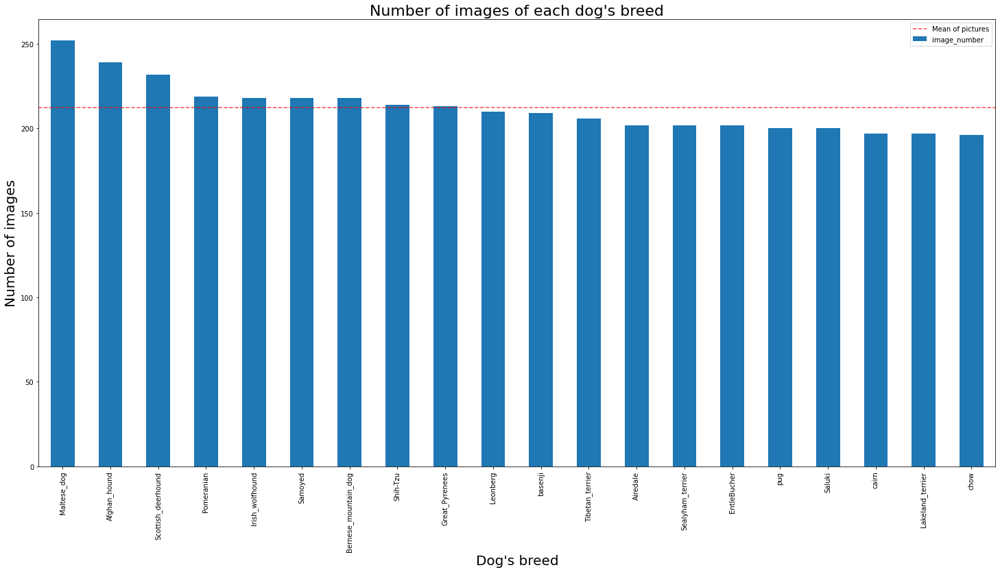

In [21]:
# Plot the distribution of the number of images of each breed.
(fig, ax) = plt.subplots(1, 1, figsize=(25, 12))
df_breeds_sorted.plot(kind='bar', x='breed', legend=False, ax=ax)
ax.axhline(df_breeds_sorted['image_number'].mean(), color='r',
           alpha=.7, linestyle='--', label='Mean of pictures')
ax.set_xlabel("Dog's breed", size=20)
ax.set_ylabel('Number of images', size=20)
plt.title("Number of images of each dog's breed", size=22)
plt.legend()

The distribution is quite uniform for all the breeds selected, so there will be no need for imbalance-related treatment.

### 4. Image Preprocessing

Let's take an image to do some image preprocessing.

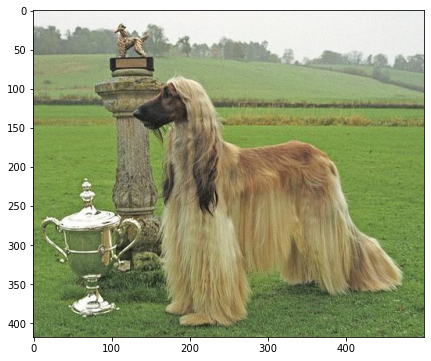

In [22]:
img = str(list(data_dir.glob('*/*.jpg'))[5])
img = cv.imread(img)
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.figure(figsize=(7, 7))
plt.imshow(img)

### 4.1 Histogram Equalization 

Histogram Equalization is an image processing technique that adjusts the contrast of an image by using its histogram. To enhance the image’s contrast, it spreads out the most frequent pixel intensity values or stretches out the intensity range of the image. By accomplishing this, histogram equalization allows the image’s areas with lower contrast to gain a higher contrast.

In [23]:


def equalization_process(img):
    """Image processing using histogram equalization.

    Args:
        img: the image.
    Returns:
        the image after histogram equalization process.
        
    """

    if type(img) != np.ndarray:
        img = img.numpy().astype('uint8')
    (hist, bins) = np.histogram(img.flatten(), 256, [0, 256])
    cdf = hist.cumsum()
    cdf_m = np.ma.masked_equal(cdf, 0)
    cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())
    cdf = np.ma.filled(cdf_m, 0).astype('uint8')
    img2 = cdf[img]
    return img2

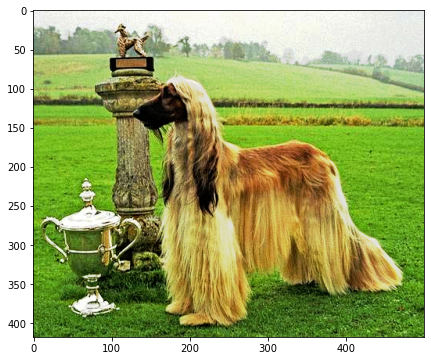

In [24]:
plt.figure(figsize=(7, 7))
plt.imshow(equalization_process(img))

In [25]:
(hist, bins) = np.histogram(img.flatten(), 256, [0, 256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()

In [26]:


def plot_img_cfd(img, cdf_norm):
    """Plot the image and its histogramme and cdf curve.
    
    Args:
        img: the image.
        cdf_norm: cdf 'the cumulative distribution function' normalized.
    """

    fig = plt.figure(figsize=(18, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.subplot(1, 2, 2)
    plt.plot(cdf_norm, color='b')
    plt.hist(img.flatten(), 256, [0, 256], color='r')
    plt.xlim([0, 256])
    plt.legend(('cdf', 'histogram'), loc='upper left')
    plt.show()

<Figure size 504x504 with 0 Axes>

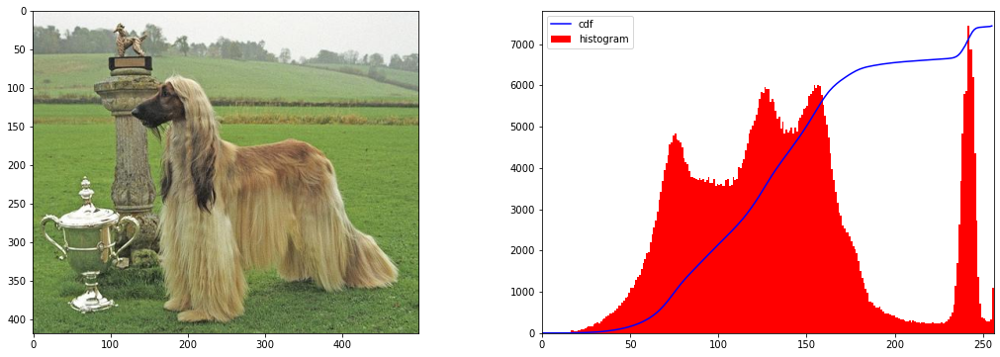

In [27]:
plt.figure(figsize = (7, 7))
plot_img_cfd(img, cdf_normalized)

As displayed in the histogram above, the majority of the pixel intensity ranges between 50 and 175 and between 200 and 250. However, we can also see that the far left areas do not have any pixel intensity values. This reveals that our test image has poor contrast.

In [28]:
cdf_m = np.ma.masked_equal(cdf, 0)
cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())
cdf = np.ma.filled(cdf_m, 0).astype('uint8')

In [29]:
img2 = cdf[img]
(hist, bins) = np.histogram(img2.flatten(), 256, [0, 256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()

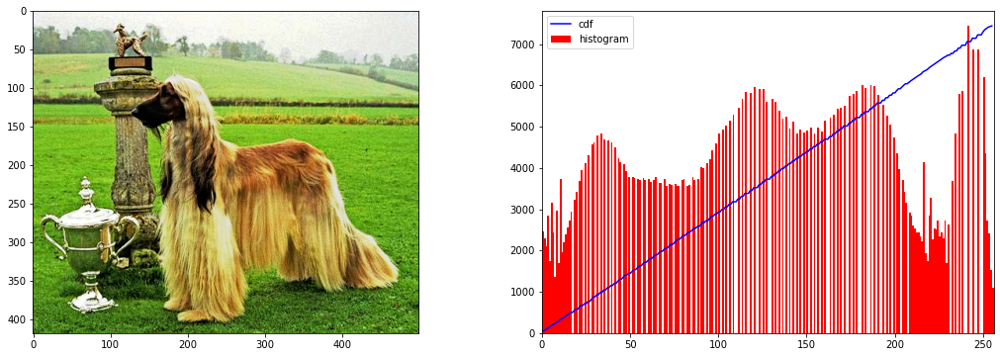

In [30]:
plot_img_cfd(img2, cdf_normalized)

Unlike the original histogram, the pixel intensity values now range from 0 to 255 on the X-axis. In a way, the original histogram has been stretched to the far ends. We may also notice that the cumulative distribution function (CDF) line is now linear as opposed to the original curved line.

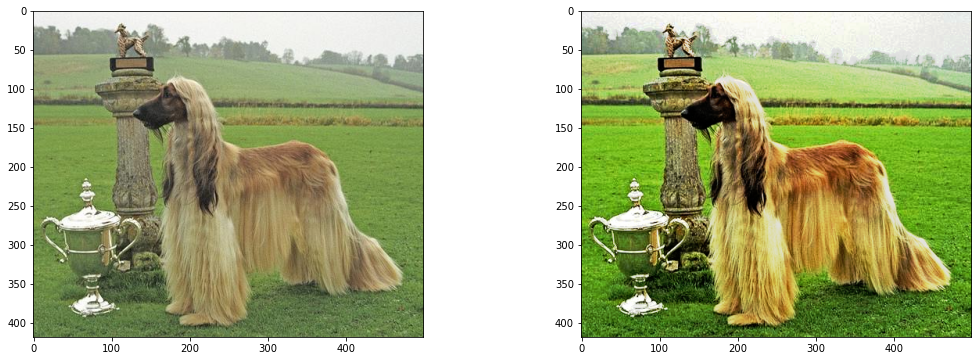

In [31]:
fig = plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
plt.imshow(img)

plt.subplot(1, 2, 2)
plt.imshow(img2)

It is clear that the histogram equalized image has better contrast. It has areas that are darker as well as brighter than the original image.

### 4.2 Non-local means filter

The non-local means filter removes noise from the input image but preserves the sharpness of strong edges, such as the silhouette of the man and buildings. This function also smooths textured regions, such as the grass in the foreground of the image, resulting in less detail when compared to the noisy image.

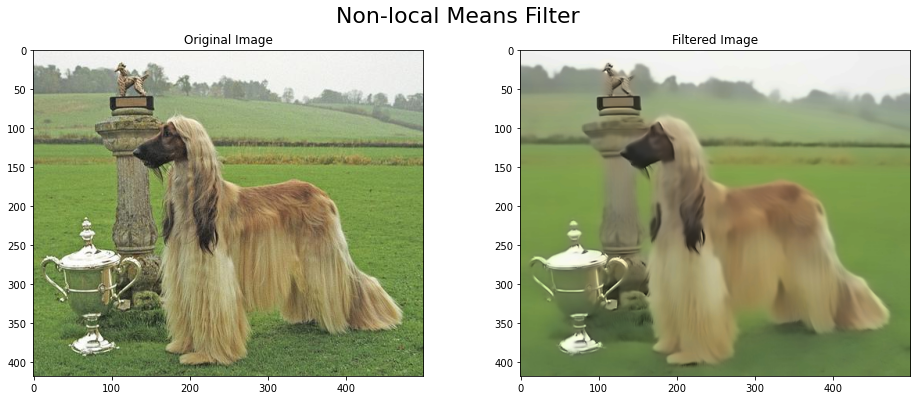

In [32]:
# Apply non-local means filter
dst_img = cv.fastNlMeansDenoisingColored(
    src=img,
    dst=None,
    h=15,
    hColor=15,
    templateWindowSize=7,
    searchWindowSize=21,
    )

# Show both img
fig = plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(dst_img)
plt.title('Filtered Image')
plt.suptitle('Non-local Means Filter', fontsize=22)
plt.show()

Display the noisy image (left) and the non-local means filtered image (right)

### 4.3 Data Augmentation

Augmentation is basically a technique that can be used to artificially expand the size of images in real-time by creating various modified versions. This will help the model to generalize and also it will improve performance.

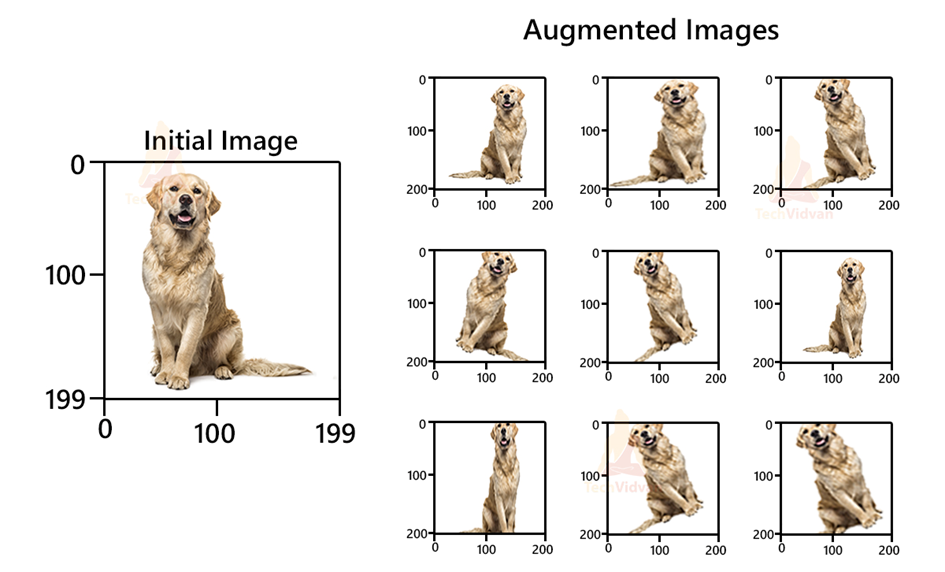

In [33]:
img_height = 350
img_width = 350
data_augmentation = keras.Sequential([layers.RandomFlip('horizontal',
        input_shape=(img_height, img_width, 3)),
        layers.RandomRotation(0.1), layers.RandomZoom(0.1)])

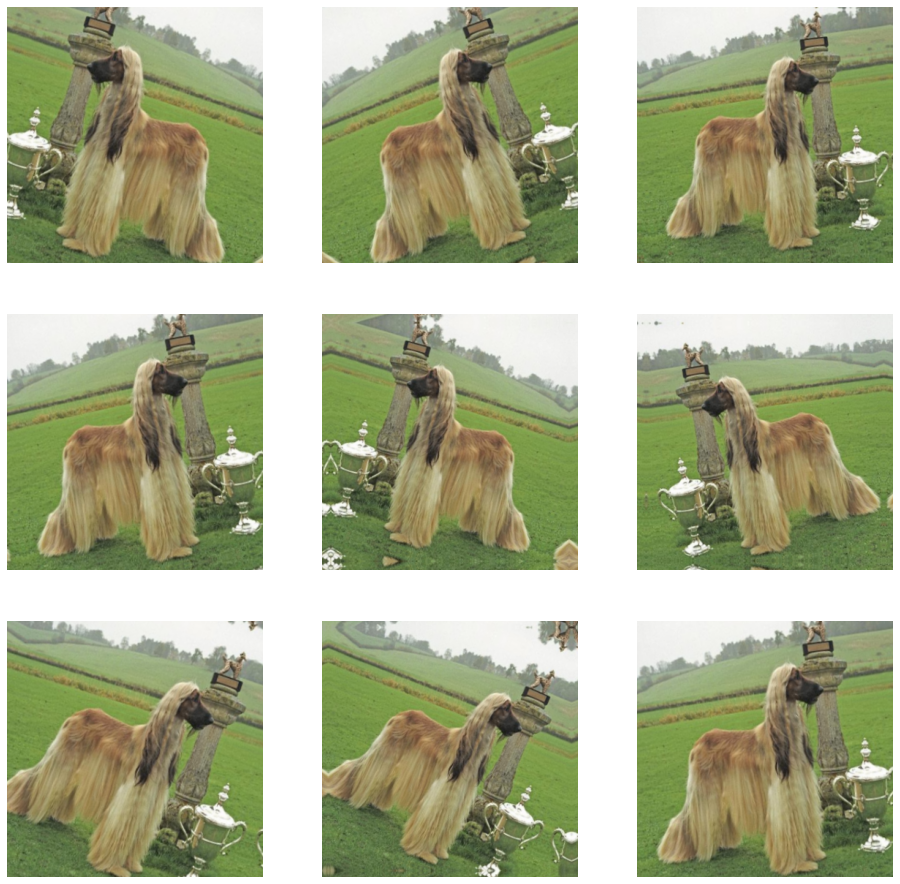

In [34]:
images = cv.resize(img, (img_height, img_width))
images = images.reshape(1, img_height, img_width, 3)
plt.figure(figsize=(16, 16))
for i in range(9):
    augmented_images = data_augmentation(images, training=True)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype('uint8'))
    plt.axis('off')

## 5. Modeling

### 5.1 Convolution Neural Network (CNN) from Scratch

### Why CNNs?
The CNNs have several different filters/kernels consisting of trainable parameters which can convolve on a given image spatially to detect features like edges and shapes. These high number of filters essentially learn to capture spatial features from the image based on the learned weights through back propagation and stacked layers of filters can be used to detect complex spatial shapes from the spatial features at every subsequent level. Hence they can successfully boil down a given image into a highly abstracted representation which is easy for predicting.

### Standard CNN archetecture

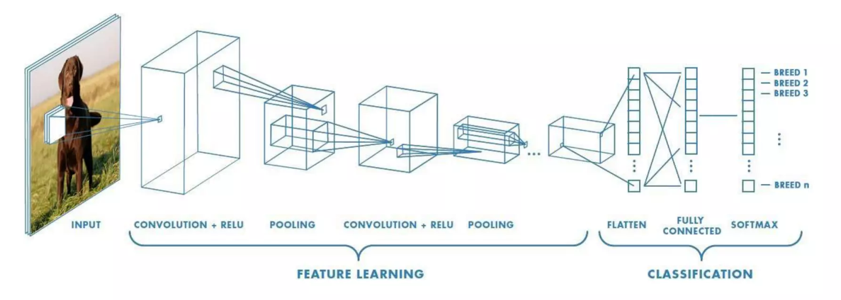

### Create a dataset

We initialize some parameters:

In [35]:
batch_size = 32
img_height = 160
img_width = 160
img_size = (img_height, img_width)

We load these images off disk using the helpful tf.keras.utils.image_dataset_from_directory utility. We use 80% of the images for training and 20% for validation.

In [36]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    )

Found 4244 files belonging to 20 classes.
Using 3396 files for training.


In [37]:
# Display the class names. These correspond to the directory names in alphabetical order.
class_names = train_ds.class_names
print(class_names)

['Afghan_hound', 'Airedale', 'Bernese_mountain_dog', 'EntleBucher', 'Great_Pyrenees', 'Irish_wolfhound', 'Lakeland_terrier', 'Leonberg', 'Maltese_dog', 'Pomeranian', 'Saluki', 'Samoyed', 'Scottish_deerhound', 'Sealyham_terrier', 'Shih-Tzu', 'Tibetan_terrier', 'basenji', 'cairn', 'chow', 'pug']


In [38]:
num_classes = len(class_names)
print('Number of classes in dataset:', num_classes)

Number of classes in dataset: 20


In [39]:
val_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    )

Found 4244 files belonging to 20 classes.
Using 848 files for validation.


As the original dataset doesn't contain a test set, we will create one. To do so, we determine how many batches of data are available in the validation set using **tf.data.experimental.cardinality**, then move 20% of them to a test set.

In [40]:
val_batches = tf.data.experimental.cardinality(val_ds)
test_ds = val_ds.take(val_batches // 5)
val_ds = val_ds.skip(val_batches // 5)

In [41]:
print('Number of validation batches: %d' \
    % tf.data.experimental.cardinality(val_ds))
print('Number of test batches: %d' \
    % tf.data.experimental.cardinality(test_ds))

Number of validation batches: 22
Number of test batches: 5


In [42]:
# We equalize the train_ds.
equalizer_ds = train_ds.map(lambda x, y: \
                            (tf.py_function(equalization_process, [x],
                            tf.float32), y))

In [43]:
for (image_batch, labels_batch) in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

(32, 160, 160, 3)
(32,)


The image_batch is a tensor of the shape (32, 180, 180, 3). This is a batch of 32 images of shape 180x180x3 (the last dimension refers to color channels RGB). The label_batch is a tensor of the shape (32,), these are corresponding labels to the 32 images.

We use buffered prefetching, so we can yield data from disk without having I/O become blocking. These are two important methods used when loading data:

- **Dataset.cache** keeps the images in memory after they're loaded off disk during the first epoch. This will ensure the dataset does not become a bottleneck while training our model. If our dataset is too large to fit into memory, you can also use this method to create a performant on-disk cache.

- **Dataset.prefetch** overlaps data preprocessing and model execution while training.

In [44]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size=AUTOTUNE)
equalizer_ds = equalizer_ds.prefetch(buffer_size=AUTOTUNE)

### Standardize the data

The RGB channel values are in the [0, 255] range. This is not ideal for a neural network; We will standardize values to be in the [0, 1] range by using **tf.keras.layers.Rescaling**.

In [45]:
normalization_layer = layers.Rescaling(1. / 255)

In [46]:
# check if the data are normalized.
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
(image_batch, labels_batch) = next(iter(normalized_ds))
first_image = image_batch[0]

print(np.min(first_image), np.max(first_image))

0.0 1.0


There are two ways to implement preprocessing data, either using dataset.map or implementing inside a model. the second option has the advantage of having only one block in the model and therefore more efficient when using GPU.

### 5.1.1 CNN Model Without image prerocessing (Histogram Equalization)

In [47]:


def visualize_results(history, epochs):
    """Calculate:
        - the training and validation accuracy
        - calculate the training and validation loss 
        - visualize the result 

    Args:
        history (obj) : Model Training History.
        epocks (int): the nomber of epocks.

    """

    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs_range = range(epochs)

    plt.figure(figsize=(14, 8))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='upper left')
    plt.title('Training and Validation Accuracy')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()

The model consists of three convolution blocks **tf.keras.layers.Conv2D** with a max pooling layer **tf.keras.layers.MaxPooling2D** in each of them. There's a fully-connected layer **tf.keras.layers.Dense** with 128 units on top of it that is activated by a ReLU activation function '**relu**'. This model has not been tuned for high accuracy; the goal of this tutorial is to show a standard approach

In [48]:
model = Sequential([
    layers.Rescaling(1. / 255, input_shape=(img_height, img_width, 3)),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes, activation='softmax'),
    ])

### Compile the model

We choose the **tf.keras.optimizers.Adam** optimizer and **tf.keras.losses.SparseCategoricalCrossentropy** loss function and '**accuracy**' as metric.

In [49]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

### Model summary

Display all the layers of the network using the Keras **Model.summary** method.

In [50]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 160, 160, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 80, 80, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 80, 80, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 40, 40, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 40, 40, 64)       

### Train the model

Train the model for 10 epochs with the Keras **Model.fit** method.

In [51]:
epochs = 10
history = model.fit(train_ds, validation_data=val_ds, epochs=epochs)

Epoch 1/10
107/107 [==============================] - 84s 773ms/step - loss: 2.9841 - accuracy: 0.0742 - val_loss: 2.9457 - val_accuracy: 0.0828
Epoch 2/10
107/107 [==============================] - 68s 630ms/step - loss: 2.7666 - accuracy: 0.1443 - val_loss: 2.6073 - val_accuracy: 0.1744
Epoch 3/10
107/107 [==============================] - 69s 637ms/step - loss: 2.4102 - accuracy: 0.2544 - val_loss: 2.4242 - val_accuracy: 0.2398
Epoch 4/10
107/107 [==============================] - 72s 665ms/step - loss: 2.0486 - accuracy: 0.3769 - val_loss: 2.4149 - val_accuracy: 0.2587
Epoch 5/10
107/107 [==============================] - 68s 636ms/step - loss: 1.5297 - accuracy: 0.5356 - val_loss: 2.7478 - val_accuracy: 0.2573
Epoch 6/10
107/107 [==============================] - 69s 641ms/step - loss: 1.0111 - accuracy: 0.6870 - val_loss: 3.2804 - val_accuracy: 0.2471
Epoch 7/10
107/107 [==============================] - 71s 660ms/step - loss: 0.5803 - accuracy: 0.8292 - val_loss: 4.2001 - val_ac

### Visualize training results

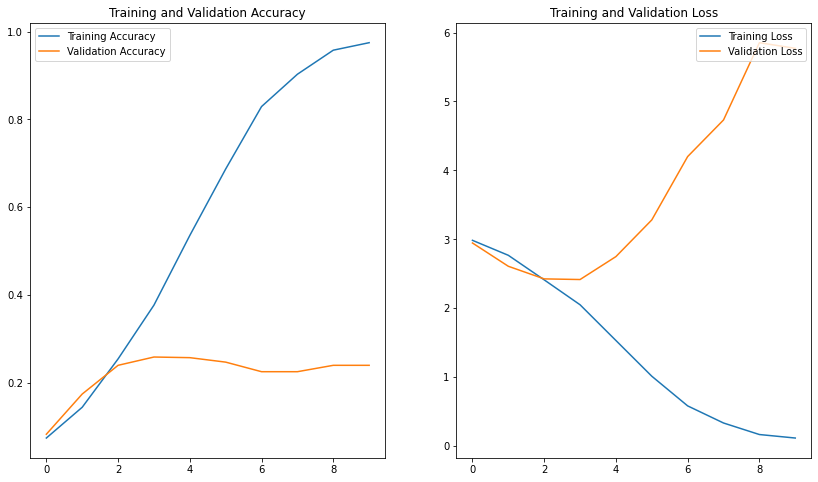

In [52]:
visualize_results(history, epochs)

The plots show that training accuracy and validation accuracy are off by large margins, and the model has achieved only around 20% accuracy on the validation set.

### Evaluate the model

In [53]:
(loss, accuracy) = model.evaluate(test_ds)
print('Test accuracy without Histogram Equalization:', accuracy)

5/5 [==============================] - 1s 201ms/step - loss: 5.5795 - accuracy: 0.2313
Test accuracy without Histogram Equalization: 0.23125000298023224


### 5.1.2 CNN Model With image preprocessing (Histogram Equalization)

### Create the model

In [54]:
model = Sequential([
    layers.Rescaling(1. / 255, input_shape=(img_height, img_width, 3)),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes, activation='softmax'),
    ])

### Compile the model

In [55]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

### Model summary

In [56]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 160, 160, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 80, 80, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 80, 80, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 40, 40, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 40, 40, 64)       

### Train the model

In [57]:
# test with equalizer_ds
epochs = 10
history_equa = model.fit(equalizer_ds, validation_data=val_ds,
                         epochs=epochs)

Epoch 1/10
107/107 [==============================] - 74s 674ms/step - loss: 2.9977 - accuracy: 0.0692 - val_loss: 2.9149 - val_accuracy: 0.1163
Epoch 2/10
107/107 [==============================] - 74s 691ms/step - loss: 2.7278 - accuracy: 0.1690 - val_loss: 2.6362 - val_accuracy: 0.1657
Epoch 3/10
107/107 [==============================] - 73s 673ms/step - loss: 2.3201 - accuracy: 0.2898 - val_loss: 2.6708 - val_accuracy: 0.2020
Epoch 4/10
107/107 [==============================] - 73s 675ms/step - loss: 1.7990 - accuracy: 0.4464 - val_loss: 2.8545 - val_accuracy: 0.2311
Epoch 5/10
107/107 [==============================] - 73s 681ms/step - loss: 1.1749 - accuracy: 0.6372 - val_loss: 3.3340 - val_accuracy: 0.2093
Epoch 6/10
107/107 [==============================] - 75s 700ms/step - loss: 0.6237 - accuracy: 0.8183 - val_loss: 4.2367 - val_accuracy: 0.2209
Epoch 7/10
107/107 [==============================] - 80s 741ms/step - loss: 0.3247 - accuracy: 0.9069 - val_loss: 4.8483 - val_ac

### Visualize training results

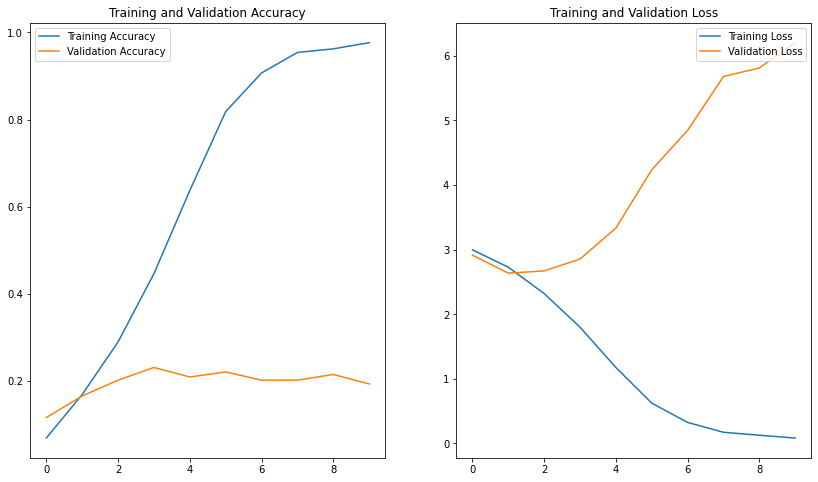

In [58]:
visualize_results(history_equa, epochs)

### Evaluate the model

In [59]:
(loss, accuracy) = model.evaluate(test_ds)
print('Test accuracy with Histogram Equaliztion:', accuracy)

5/5 [==============================] - 1s 194ms/step - loss: 5.5904 - accuracy: 0.1875
Test accuracy with Histogram Equaliztion: 0.1875


With or without histogram equalization, the result is not good:
   - val_accuracy without histogram equalization: 0.23
   - val_accuracy with histogram equalization: 0.19
   
In the rest of this project train_ds will be used instead of equalize_ds.

### 5.1.3 Handling of Overfitting

In the plots above, the training accuracy is increasing over time, whereas validation accuracy stalls around 20% in the training process. Also, the difference in accuracy between training and validation accuracy is noticeable—a sign of **overfitting**.

When there are a small number of training examples, the model sometimes learns from noises or unwanted details from training examples—to an extent that it negatively impacts the performance of the model on new examples. This phenomenon is known as overfitting. It means that the model will have a difficult time generalizing on a new dataset.

There are multiple ways to fight overfitting in the training process.among these ways, there are data augmentation and dropout.

### - Data augmentation

**Data augmentation** takes the approach of generating additional training data from our existing examples by augmenting them using random transformations that yield believable-looking images. This helps expose the model to more aspects of the data and generalize better.

In [60]:
data_augmentation = \
    tf.keras.Sequential([tf.keras.layers.RandomFlip('horizontal',
                        input_shape=(img_height, img_width, 3)),
                        tf.keras.layers.RandomRotation(0.2),
                        tf.keras.layers.RandomZoom(0.1)])

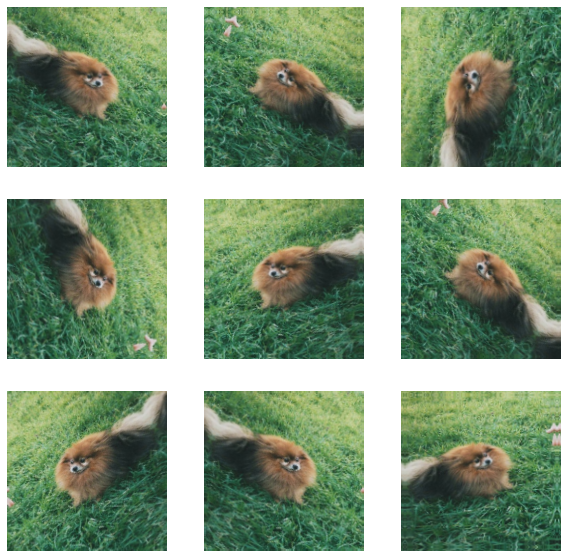

In [61]:
for (image, _) in train_ds.take(1):
    plt.figure(figsize=(10, 10))
    first_image = image[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(tf.expand_dims(first_image,
                0), training=True)
        plt.imshow(augmented_image[0] / 255)
        plt.axis('off')

### 5.1.4 CNN Model with data augmentation

In [62]:
model = Sequential([
    data_augmentation,
    layers.Rescaling(1. / 255),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes, activation='softmax', name='outputs'),
    ])

### Compile and train the model

In [63]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [64]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_3 (Sequential)   (None, 160, 160, 3)       0         
                                                                 
 rescaling_3 (Rescaling)     (None, 160, 160, 3)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 80, 80, 16)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 80, 80, 32)        4640      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 40, 40, 32)       0         
 2D)                                                  

In [65]:
epochs = 20
history = model.fit(train_ds, validation_data=val_ds, epochs=epochs)

Epoch 1/20
107/107 [==============================] - 80s 722ms/step - loss: 2.9686 - accuracy: 0.0748 - val_loss: 2.9130 - val_accuracy: 0.0872
Epoch 2/20
107/107 [==============================] - 78s 729ms/step - loss: 2.7859 - accuracy: 0.1290 - val_loss: 2.6527 - val_accuracy: 0.1773
Epoch 3/20
107/107 [==============================] - 78s 725ms/step - loss: 2.6324 - accuracy: 0.1890 - val_loss: 2.5860 - val_accuracy: 0.1962
Epoch 4/20
107/107 [==============================] - 79s 730ms/step - loss: 2.5346 - accuracy: 0.2079 - val_loss: 2.5469 - val_accuracy: 0.2020
Epoch 5/20
107/107 [==============================] - 78s 730ms/step - loss: 2.4804 - accuracy: 0.2338 - val_loss: 2.4589 - val_accuracy: 0.2108
Epoch 6/20
107/107 [==============================] - 79s 731ms/step - loss: 2.4111 - accuracy: 0.2500 - val_loss: 2.4406 - val_accuracy: 0.2558
Epoch 7/20
107/107 [==============================] - 79s 739ms/step - loss: 2.3850 - accuracy: 0.2594 - val_loss: 2.3969 - val_ac

### Visualize training results

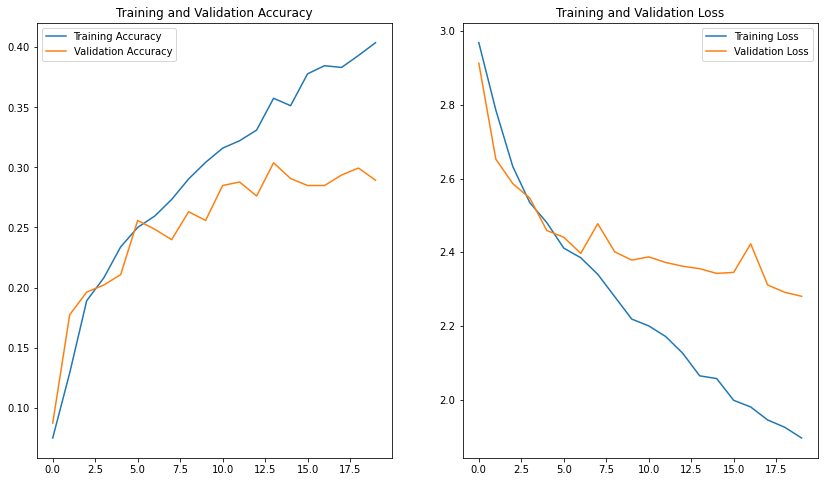

In [66]:
visualize_results(history, epochs)

We notice that there is a clear improvement taking into account the data augmentation. There is less overfitting than before, and training and validation accuracy are closer aligned.

### Evaluate the model

In [67]:
(loss, accuracy) = model.evaluate(test_ds)
print('Test accuracy with data augmentation:', accuracy)

5/5 [==============================] - 1s 209ms/step - loss: 2.3100 - accuracy: 0.3125
Test accuracy with data augmentation: 0.3125


### - Dropout technique

Another technique to reduce overfitting is to introduce dropout regularization to the network.

When we apply dropout to a layer, it randomly drops out (by setting the activation to zero) a number of output units from the layer during the training process. Dropout takes a fractional number as its input value, in the form such as 0.1, 0.2, 0.4, etc. This means dropping out 10%, 20% or 40% of the output units randomly from the applied layer.

### 5.5.1 CNN Model with Data Augmentation and Dropout

In [68]:
model = Sequential([
    data_augmentation,
    layers.Rescaling(1. / 255),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Dropout(0.2),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Dropout(0.2),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Dropout(0.2),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes, activation='softmax', name='outputs'),
    ])

### Compile and train the model

In [69]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [70]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_3 (Sequential)   (None, 160, 160, 3)       0         
                                                                 
 rescaling_4 (Rescaling)     (None, 160, 160, 3)       0         
                                                                 
 conv2d_9 (Conv2D)           (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 80, 80, 16)       0         
 2D)                                                             
                                                                 
 dropout (Dropout)           (None, 80, 80, 16)        0         
                                                                 
 conv2d_10 (Conv2D)          (None, 80, 80, 32)        4640      
                                                      

In [71]:
epochs = 20
history = model.fit(train_ds, validation_data=val_ds, epochs=epochs)

Epoch 1/20
107/107 [==============================] - 93s 841ms/step - loss: 3.0647 - accuracy: 0.0527 - val_loss: 2.9834 - val_accuracy: 0.0959
Epoch 2/20
107/107 [==============================] - 91s 851ms/step - loss: 2.9177 - accuracy: 0.1075 - val_loss: 2.8464 - val_accuracy: 0.1163
Epoch 3/20
107/107 [==============================] - 95s 881ms/step - loss: 2.7879 - accuracy: 0.1366 - val_loss: 2.8206 - val_accuracy: 0.1192
Epoch 4/20
107/107 [==============================] - 90s 835ms/step - loss: 2.7150 - accuracy: 0.1640 - val_loss: 2.7435 - val_accuracy: 0.1584
Epoch 5/20
107/107 [==============================] - 88s 819ms/step - loss: 2.6107 - accuracy: 0.1893 - val_loss: 2.5536 - val_accuracy: 0.2340
Epoch 6/20
107/107 [==============================] - 89s 830ms/step - loss: 2.5228 - accuracy: 0.2132 - val_loss: 2.5410 - val_accuracy: 0.2355
Epoch 7/20
107/107 [==============================] - 89s 826ms/step - loss: 2.4732 - accuracy: 0.2312 - val_loss: 2.5871 - val_ac

### Visualize training results

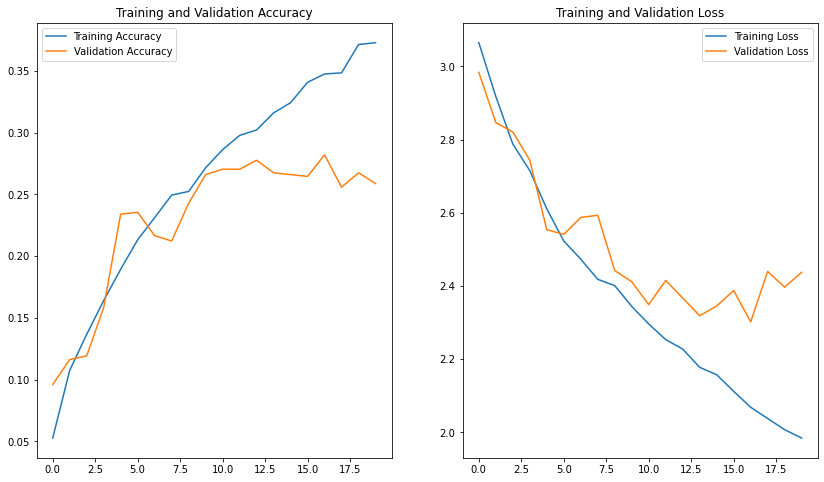

In [72]:
visualize_results(history, epochs)

There is less overfitting than before, and training and validation accuracy are closer aligned. 

### Evaluate the model

In [73]:
loss, accuracy = model.evaluate(test_ds)
print('Test accuracy with data augmentation + dropout:', accuracy)

5/5 [==============================] - 1s 186ms/step - loss: 2.4955 - accuracy: 0.2062
Test accuracy with data augmentation + dropout: 0.20624999701976776


### - BatchNormalization

**Batch Normalization** aims to reduce internal covariate shift, and in doing so aims to accelerate the training of deep neural nets. It accomplishes this via a normalization step that fixes the means and variances of layer inputs. Batch Normalization also has a beneficial effect on the gradient flow through the network, by reducing the dependence of gradients on the scale of the parameters or of their initial values. This allows for use of much higher learning rates without the risk of divergence. Furthermore, batch normalization regularizes the model and reduces the need for Dropout.

### 5.1.6 CNN Model with Data Augmentation, Dropout and Batch Normalisation

In [74]:
model = Sequential([
    data_augmentation,
    layers.Rescaling(1. / 255),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Dropout(0.2),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Dropout(0.2),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Dropout(0.2),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.2),
    layers.Dense(num_classes, activation='softmax', name='outputs'),
    ])

### Compile and train the model

In [75]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [76]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_3 (Sequential)   (None, 160, 160, 3)       0         
                                                                 
 rescaling_5 (Rescaling)     (None, 160, 160, 3)       0         
                                                                 
 conv2d_12 (Conv2D)          (None, 160, 160, 16)      448       
                                                                 
 batch_normalization (BatchN  (None, 160, 160, 16)     64        
 ormalization)                                                   
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 80, 80, 16)       0         
 g2D)                                                            
                                                                 
 dropout_3 (Dropout)         (None, 80, 80, 16)       

In [77]:
epochs = 20
history = model.fit(train_ds, validation_data=val_ds, epochs=epochs)

Epoch 1/20
107/107 [==============================] - 119s 1s/step - loss: 3.0721 - accuracy: 0.1243 - val_loss: 15.3118 - val_accuracy: 0.0523
Epoch 2/20
107/107 [==============================] - 118s 1s/step - loss: 2.7396 - accuracy: 0.1687 - val_loss: 8.0930 - val_accuracy: 0.0523
Epoch 3/20
107/107 [==============================] - 123s 1s/step - loss: 2.6404 - accuracy: 0.2023 - val_loss: 5.5941 - val_accuracy: 0.1061
Epoch 4/20
107/107 [==============================] - 117s 1s/step - loss: 2.5587 - accuracy: 0.2147 - val_loss: 6.2509 - val_accuracy: 0.0930
Epoch 5/20
107/107 [==============================] - 114s 1s/step - loss: 2.4902 - accuracy: 0.2379 - val_loss: 9.5980 - val_accuracy: 0.0828
Epoch 6/20
107/107 [==============================] - 113s 1s/step - loss: 2.4742 - accuracy: 0.2468 - val_loss: 3.1272 - val_accuracy: 0.1555
Epoch 7/20
107/107 [==============================] - 114s 1s/step - loss: 2.3613 - accuracy: 0.2718 - val_loss: 3.7666 - val_accuracy: 0.159

### Visualize training results

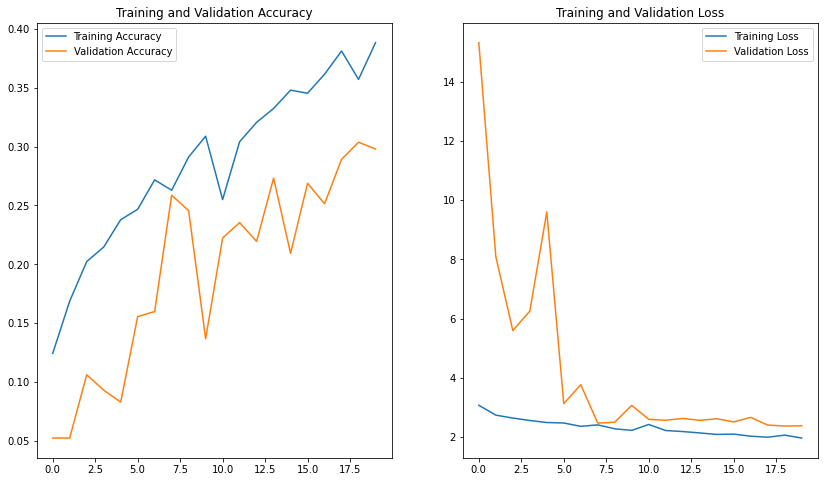

In [78]:
visualize_results(history, epochs)

### Evaluate the model

In [79]:
(loss, accuracy) = model.evaluate(test_ds)
print('Test accuracy with data augmentation +dropout + batchnormalization:'
       , accuracy)

5/5 [==============================] - 2s 299ms/step - loss: 2.4654 - accuracy: 0.2750
Test accuracy with data augmentation +dropout + batchnormalization: 0.2750000059604645


### 5.1.7 Model with Data Augmentation, Dropout and Batch Normalisation + Dense & Conv layers

In [80]:
model = Sequential([
    data_augmentation,
    layers.Rescaling(1. / 255),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Dropout(0.2),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Dropout(0.2),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Dropout(0.2),
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.2),
    layers.Dense(512, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(num_classes, activation='softmax'),
    ])

### Compile and train the model

In [81]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [82]:
model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_3 (Sequential)   (None, 160, 160, 3)       0         
                                                                 
 rescaling_6 (Rescaling)     (None, 160, 160, 3)       0         
                                                                 
 conv2d_15 (Conv2D)          (None, 160, 160, 32)      896       
                                                                 
 batch_normalization_4 (Batc  (None, 160, 160, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 80, 80, 32)       0         
 g2D)                                                            
                                                                 
 dropout_7 (Dropout)         (None, 80, 80, 32)       

In [83]:
epochs = 50
history = model.fit(train_ds, validation_data=val_ds, epochs=epochs)

Epoch 1/50
107/107 [==============================] - 228s 2s/step - loss: 3.8349 - accuracy: 0.1048 - val_loss: 4.5454 - val_accuracy: 0.0465
Epoch 2/50
107/107 [==============================] - 225s 2s/step - loss: 3.4013 - accuracy: 0.1278 - val_loss: 5.0549 - val_accuracy: 0.0494
Epoch 3/50
107/107 [==============================] - 224s 2s/step - loss: 3.1649 - accuracy: 0.1537 - val_loss: 4.5124 - val_accuracy: 0.0741
Epoch 4/50
107/107 [==============================] - 224s 2s/step - loss: 3.1339 - accuracy: 0.1449 - val_loss: 3.3452 - val_accuracy: 0.1119
Epoch 5/50
107/107 [==============================] - 225s 2s/step - loss: 2.9362 - accuracy: 0.1587 - val_loss: 2.9115 - val_accuracy: 0.1657
Epoch 6/50
107/107 [==============================] - 233s 2s/step - loss: 2.7953 - accuracy: 0.1870 - val_loss: 2.8461 - val_accuracy: 0.1730
Epoch 7/50
107/107 [==============================] - 224s 2s/step - loss: 2.7253 - accuracy: 0.1873 - val_loss: 2.5020 - val_accuracy: 0.2137

### Visualize training results

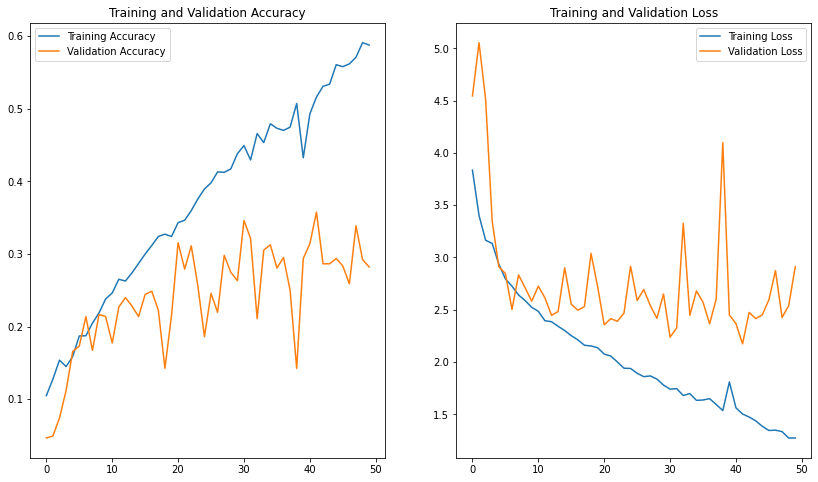

In [84]:
visualize_results(history, epochs)

### Evaluate the Model

In [85]:
(loss, accuracy) = model.evaluate(test_ds)
print('Test accuracy - global model:', accuracy)

5/5 [==============================] - 3s 526ms/step - loss: 2.9834 - accuracy: 0.2937
Test accuracy - global model: 0.29374998807907104


### 5.3 Tuning the model with Keras tuner

In [86]:


def build_model(hp):
    """Tuning the model with keras tuner

    Args:
        hp : instance of the class HyperParameters
    Returns:
        the model after compilation.

    """

    # ============= create model object =============
    model = Sequential([
        data_augmentation,
        layers.Rescaling(1. / 255),
        layers.Conv2D(filters=hp.Int('conv_1_filter', min_value=16,
                      max_value=64, step=16),
                      kernel_size=hp.Choice('conv_1_kernel', values=[3,5]),
                      padding='same', activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D(),
        layers.Dropout(0.2),
        layers.Conv2D(filters=hp.Int('conv_2_filter', min_value=32,
                      max_value=128, step=16),
                      kernel_size=hp.Choice('conv_2_kernel', values=[3,5]),
                      padding='same', activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D(),
        layers.Dropout(0.2),
        layers.Conv2D(filters=hp.Int('conv_3_filter', min_value=64,
                      max_value=128, step=16),
                      kernel_size=hp.Choice('conv_3_kernel', values=[3,5]),
                      padding='same', activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D(),
        layers.Dropout(0.2),
        layers.Flatten(),
        layers.Dense(units=hp.Int('dense_1_units', min_value=32,
                     max_value=128, step=16), activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax', name='outputs'),
        ])

    # ============= Compilation optimization =============

    # choice of learning rate values
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    # choice of optimizers
    optimizers_dict = \
        {'Adam': tf.keras.optimizers.Adam(learning_rate=hp_learning_rate),
         'SGD': tf.keras.optimizers.SGD(learning_rate=hp_learning_rate),
         'RMSprop': tf.keras.optimizers.RMSprop(learning_rate=hp_learning_rate)}

    hp_optimizers = hp.Choice('optimizer', values=['Adam', 'SGD', 'RMSprop'])

    # compilation of model
    model.compile(optimizer=optimizers_dict[hp_optimizers],
                  loss='SparseCategoricalCrossentropy',
                  metrics=['accuracy'])

    return model

### Optimize Model

For more details about the choice of the optimization method applied in this section, see this article [hyperparameter tuning in Keras tensorflow](https://medium.com/swlh/hyperparameter-tuning-in-keras-tensorflow-2-with-keras-tuner-randomsearch-hyperband-3e212647778f)

In [87]:
# creating BayesianOptimization object
tuner = kt.BayesianOptimization(hypermodel=build_model,
                                objective='val_accuracy',
                                overwrite=True, max_trials=10)

# search best parameter
tuner.search(train_ds, epochs=30, validation_data=val_ds)

Trial 10 Complete [01h 53m 16s]
val_accuracy: 0.33139535784721375

Best val_accuracy So Far: 0.33139535784721375
Total elapsed time: 22h 19m 21s
INFO:tensorflow:Oracle triggered exit


In [88]:
# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Hyperparameters optimization :")
print("=" * len("Hyperparameters optimization :"))
print(f"""
        Best conv 1 filter : {best_hps.get('conv_1_filter')}.\n
        Best conv 1 kernel : {best_hps.get('conv_1_kernel')}.\n
        Best conv 2 filter : {best_hps.get('conv_2_filter')}.\n
        Best conv 3 kernel : {best_hps.get('conv_3_kernel')}.\n
        Best dense 1 units : {best_hps.get('dense_1_units')}.\n
        Best learning rate : {best_hps.get('learning_rate')}.\n
        Best optimizer : {best_hps.get('optimizer')}.""")

Hyperparameters optimization :

Best conv 1 filter : 16.

Best conv 1 kernel : 5.

Best conv 2 filter : 128.

Best conv 3 kernel : 3.

Best dense 1 units : 48.

Best learning rate : 0.01.

Best optimizer : Adam.


In [89]:
model = tuner.get_best_models(num_models=1)[0]

# summary of best model
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_3 (Sequential)   (None, 160, 160, 3)       0         
                                                                 
 rescaling (Rescaling)       (None, 160, 160, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 160, 160, 16)      1216      
                                                                 
 batch_normalization (BatchN  (None, 160, 160, 16)     64        
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 80, 80, 16)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 80, 80, 16)        0

In [90]:
# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print(best_hps.values)

{'conv_1_filter': 16, 'conv_1_kernel': 5, 'conv_2_filter': 128, 'conv_2_kernel': 3, 'conv_3_filter': 80, 'conv_3_kernel': 3, 'dense_1_units': 48, 'learning_rate': 0.01, 'optimizer': 'Adam'}


In [91]:
model = tuner.hypermodel.build(best_hps)

Now we fit our training data with the values that we have obtained from the hyper tuning of the model.

In [94]:
epochs = 50
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)

# This callback will stop the training when there is no improvement in
# the loss for three consecutive epochs.
history = model.fit(train_ds, validation_data=val_ds, epochs=epochs,
                    callbacks=[callback])

Epoch 1/50
107/107 [==============================] - 231s 2s/step - loss: 2.4036 - accuracy: 0.2418 - val_loss: 2.8258 - val_accuracy: 0.1497
Epoch 2/50
107/107 [==============================] - 229s 2s/step - loss: 2.3773 - accuracy: 0.2553 - val_loss: 2.4847 - val_accuracy: 0.2297
Epoch 3/50
107/107 [==============================] - 240s 2s/step - loss: 2.3482 - accuracy: 0.2527 - val_loss: 2.5396 - val_accuracy: 0.2413
Epoch 4/50
107/107 [==============================] - 228s 2s/step - loss: 2.3279 - accuracy: 0.2709 - val_loss: 2.5034 - val_accuracy: 0.2180
Epoch 5/50
107/107 [==============================] - 230s 2s/step - loss: 2.3125 - accuracy: 0.2688 - val_loss: 2.3705 - val_accuracy: 0.2573
Epoch 6/50
107/107 [==============================] - 230s 2s/step - loss: 2.2598 - accuracy: 0.2856 - val_loss: 2.3786 - val_accuracy: 0.2558
Epoch 7/50
107/107 [==============================] - 231s 2s/step - loss: 2.2139 - accuracy: 0.3059 - val_loss: 2.5597 - val_accuracy: 0.2398

### Visualize training results

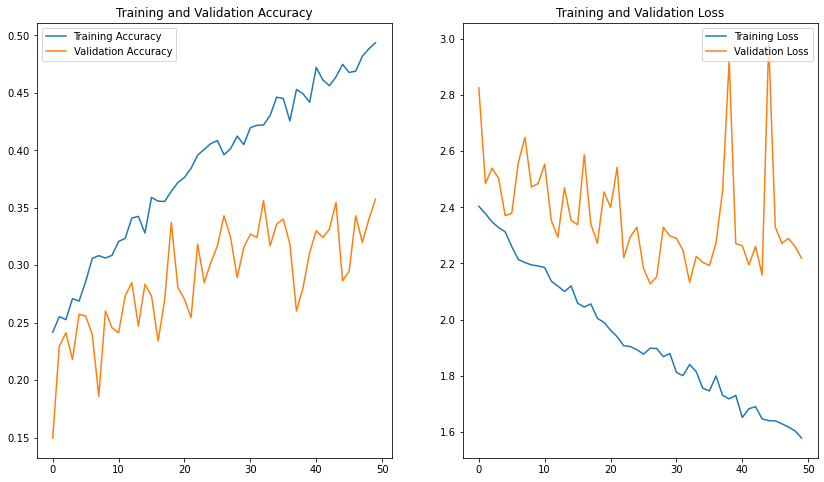

In [95]:
visualize_results(history, epochs)

### Evaluate the Model

In [96]:
(loss, accuracy) = model.evaluate(test_ds)
print('Test accuracy - global model:', accuracy)

5/5 [==============================] - 3s 448ms/step - loss: 2.3238 - accuracy: 0.3000
Test accuracy - global model: 0.30000001192092896


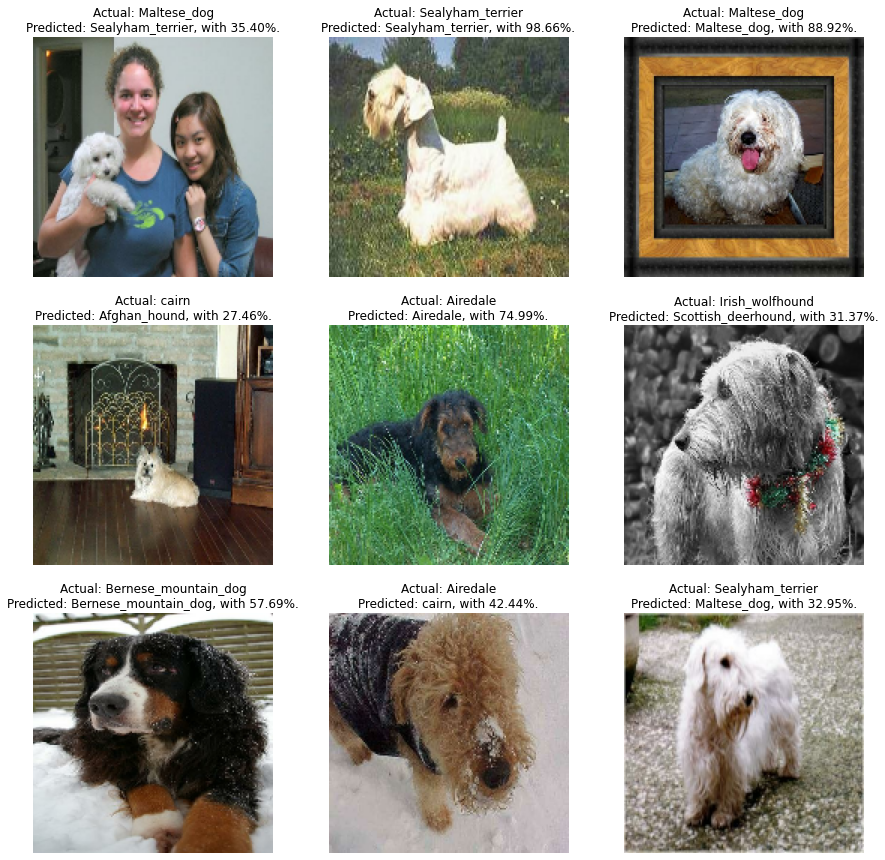

In [97]:
# Retrieve a batch of images from the test set
image_batch, label_batch = test_ds.as_numpy_iterator().next()
score = model.predict_on_batch(image_batch) 

plt.figure(figsize=(15, 15))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image_batch[i].astype("uint8"))
    plt.title('Actual: {}\nPredicted: {}, with {:.2f}%.'
              .format(class_names[label_batch[i]], class_names[np.argmax(score[i])], 100 * np.max(score[i]) ))
    plt.axis("off")

### Confusion Matrix

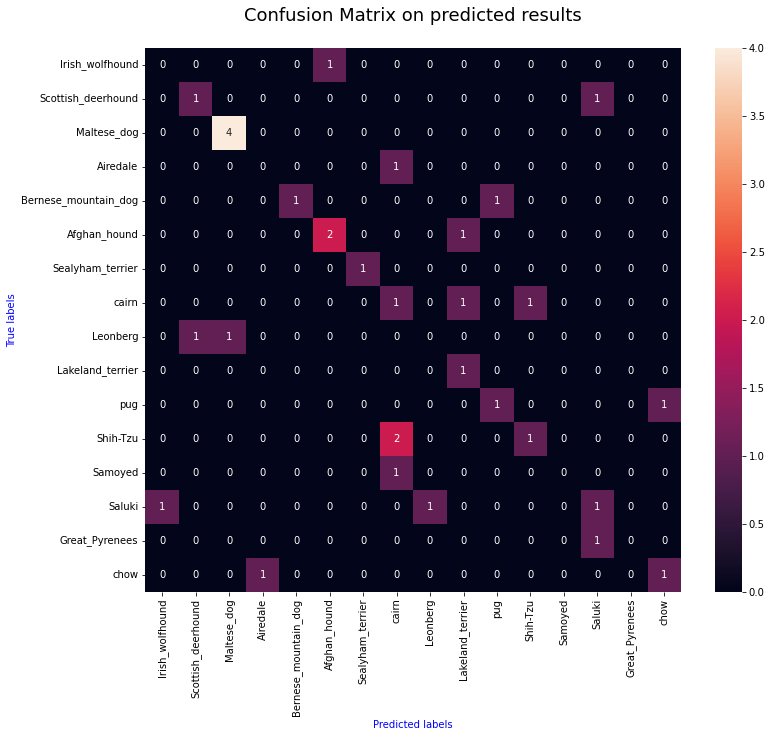

In [98]:
label = [class_names[i] for i in list(set(label_batch))]

y_test = [class_names[label_batch[i]] for i in range(len(label_batch))]
y_pred = [class_names[np.argmax(score[i])] for i in
          range(len(label_batch))]
label = list(set(y_pred + y_test))  # [class_names[i] for i in list(set(y_test))]
cf_matrix = confusion_matrix(y_test, y_pred)

fig = plt.figure(figsize=(12, 10))
ax = sns.heatmap(cf_matrix, annot=True)
ax.set_xlabel('Predicted labels', color='blue')
ax.set_ylabel('True labels', color='blue')
ax.xaxis.set_ticklabels(label, rotation='vertical')
ax.yaxis.set_ticklabels(label, rotation='horizontal')
plt.title('Confusion Matrix on predicted results\n', fontsize=18)
plt.show()

With 30%, the score remains very low, which is why we are going to use transfer learning from a pre-trained network..

### 5.2 Transfer Learning

In this part, we will use transfer learning from a pre-trained network. The intuition behind transfer learning for image classification is that if a model is trained on a large and general enough dataset, this model will effectively serve as a generic model of the visual world. We can then take advantage of these learned feature maps without having to start from scratch by training a large model on a large dataset.

In this project we will use two models: **MobileNet V2** and **VG16**. We will compare them in term of time calculation and accuracy.

### 5.2.1 MobileNet V2

The MobileNet model is designed to be used in mobile applications, and it is TensorFlow’s first mobile computer vision model.

MobileNet uses depthwise separable convolutions. It significantly reduces the number of parameters when compared to the network with regular convolutions with the same depth in the nets. This results in lightweight deep neural networks.

A depthwise separable convolution is made from two operations.

- **Depthwise convolution.**
- **Pointwise convolution.**

MobileNet is a class of CNN that was open-sourced by Google, and therefore, this gives us an excellent starting point for training our classifiers that are insanely small and insanely fast.

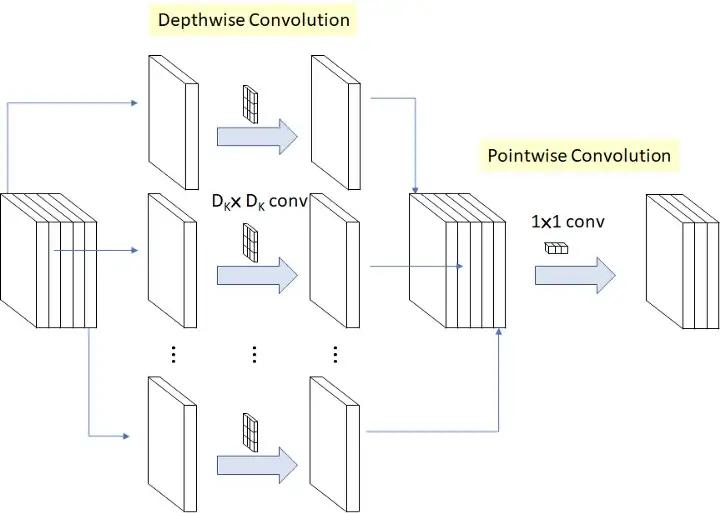

### The Architecture of MobileNet

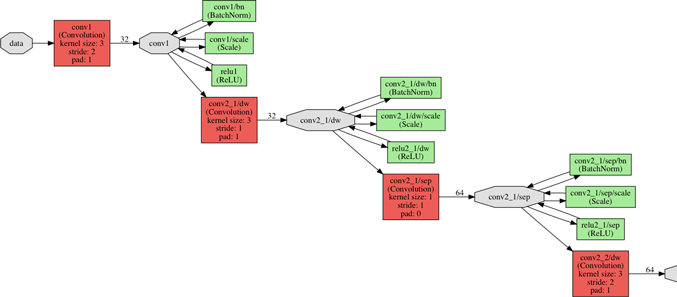

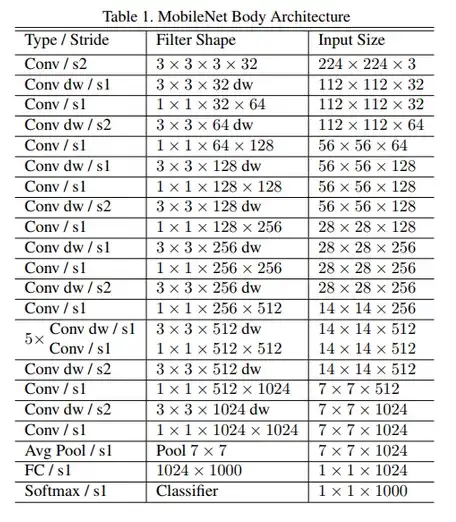

### Create the base model from the pre-trained model MobileNet V2

First, we instantiate a MobileNet V2 model pre-loaded with weights trained on ImageNet. By specifying the **include_top=False** argument, we load a network that doesn't include the classification layers at the top, which is ideal for feature extraction.

In [194]:
img_shape = img_size + (3,)
base_model = tf.keras.applications.MobileNetV2(input_shape=img_shape,
                                               include_top=False,
                                               weights='imagenet')

This feature extractor converts each 160x160x3 image into a 5x5x1280 block of features. Let's see what it does to an example batch of images

In [195]:
(image_batch, label_batch) = next(iter(train_ds))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(32, 5, 5, 1280)


### Rescale pixel values

We use **tf.keras.applications.MobileNetV2** as base model. This model expects pixel values in [-1, 1], but at this point, the pixel values in our images are in [0, 255]. To rescale them, we use the preprocessing method included with the model.

In [196]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

### Feature extraction

We will freeze the convolutional base created from the previous step and to use as a feature extractor. Additionally, we add a classifier on top of it and train the top-level classifier.

### Freeze the convolutional base

It is important to freeze the convolutional base before we compile and train the model. Freezing (by setting **layer.trainable = False**) prevents the weights in a given layer from being updated during training. **MobileNet V2** has many layers, so setting the entire model's trainable flag to False will freeze all of them.

In [197]:
base_model.trainable = False

In [198]:
# Let's take a look at the base model architecture
base_model.summary()

Model: "mobilenetv2_1.00_160"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 80, 80, 32)   864         ['input_3[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 80, 80, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (None, 80, 80, 32)   0           ['bn_Conv1[0][

 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 20, 20, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_depthwise_relu (ReLU)  (None, 20, 20, 144)  0           ['block_3_depthwise_BN[0][0]']   
                                                                                                  
 block_3_project (Conv2D)       (None, 20, 20, 32)   4608        ['block_3_depthwise_relu[0][0]'] 
                                                                                                  
 block_3_project_BN (BatchNorma  (None, 20, 20, 32)  128         ['block_3_project[0][0]']        
 lization)

 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 10, 10, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 10, 10, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)                                                                                            
                                                                                                  
 block_7_depthwise_BN (BatchNor  (None, 10, 10, 384)  1536       ['block_7_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_7_d

 block_10_project_BN (BatchNorm  (None, 10, 10, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 10, 10, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_expand_BN (BatchNorma  (None, 10, 10, 576)  2304       ['block_11_expand[0][0]']        
 lization)                                                                                        
                                                                                                  
 block_11_expand_relu (ReLU)    (None, 10, 10, 576)  0           ['block_11_expand_BN[0][0]']     
                                                                                                  
 block_11_

                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 5, 5, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 5, 5, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_project_BN (BatchNorm  (None, 5, 5, 160)   640         ['block_14_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_14_add (Add)             (None, 5, 5, 160)    0           ['block_13_project_BN[0][0]',    
                                                                  'block_14_project_BN[0][0]']    
          

### Add a classification head

We use a **tf.keras.layers.GlobalAveragePooling2D** layer to convert the features to a single 1280-element vector per image.

In [199]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 1280)


We apply a **tf.keras.layers.Dense** layer to convert these features into a single prediction per image.

In [200]:
prediction_layer = tf.keras.layers.Dense(num_classes)
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 20)


We build a model by chaining together the data augmentation, rescaling, base_model and feature extractor layers. As previously mentioned, we use **training=False** as our model contains a BatchNormalization layer.

In [201]:
inputs = tf.keras.Input(shape=img_shape)
x = data_augmentation(inputs, training=True)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

In [202]:
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 sequential_3 (Sequential)   (None, 160, 160, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 160, 160, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 160, 160, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_160 (Funct  (None, 5, 5, 1280)       2257984   
 ional)                                                          
                                                           

In [142]:
model.save('mobile_net_model_n.h5')

### Optimize hyperparameters

In [203]:
def build_model_mobilenet(hp):
    """Optimize the hyperparameters.

    Args:
        hp:  instance of the class HyperParameters.
    Returns:
        the model after compilation.

    """

    hp_learning_rate = hp.Choice(name='learning_rate', values=[1e-2,
                                 1e-3, 1e-4, 1e-5])

    model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
                  loss='SparseCategoricalCrossentropy',
                  metrics=['accuracy'])

    return model

In [205]:
# creating BayesianOptimization object
tuner = kt.BayesianOptimization(hypermodel=build_model_mobilenet,
                                objective='val_accuracy',
                                overwrite=True, max_trials=4)

# search best parameter
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5)

# This callback will stop the training when there is no improvement in
# the loss for three consecutive epochs.
tuner.search(train_ds, epochs=10, validation_data=val_ds,
             callbacks=[callback])

Trial 4 Complete [00h 09m 38s]
val_accuracy: 0.10755813866853714

Best val_accuracy So Far: 0.1744185984134674
Total elapsed time: 00h 45m 52s
INFO:tensorflow:Oracle triggered exit


In [206]:
# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print(best_hps.values)

{'learning_rate': 0.0001}


In [153]:
model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              optimizer = tf.keras.optimizers.Adam(learning_rate=best_hps.get('learning_rate')),
              metrics=['accuracy'])

In [154]:
initial_epochs = 20

history_Net = model.fit(train_ds, validation_data=val_ds,
                        epochs=initial_epochs)

Epoch 1/20
107/107 [==============================] - 110s 861ms/step - loss: 8.5875 - accuracy: 0.1054 - val_loss: 6.3067 - val_accuracy: 0.1541
Epoch 2/20
107/107 [==============================] - 91s 847ms/step - loss: 5.8188 - accuracy: 0.2155 - val_loss: 4.5750 - val_accuracy: 0.3038
Epoch 3/20
107/107 [==============================] - 92s 854ms/step - loss: 4.2404 - accuracy: 0.3136 - val_loss: 3.3731 - val_accuracy: 0.3968
Epoch 4/20
107/107 [==============================] - 91s 850ms/step - loss: 3.1165 - accuracy: 0.3775 - val_loss: 2.4856 - val_accuracy: 0.4520
Epoch 5/20
107/107 [==============================] - 93s 870ms/step - loss: 2.4890 - accuracy: 0.4382 - val_loss: 2.1790 - val_accuracy: 0.4855
Epoch 6/20
107/107 [==============================] - 93s 864ms/step - loss: 2.2023 - accuracy: 0.4732 - val_loss: 1.9658 - val_accuracy: 0.5145
Epoch 7/20
107/107 [==============================] - 92s 852ms/step - loss: 1.9023 - accuracy: 0.5197 - val_loss: 1.7129 - val_a

### Visualize the results

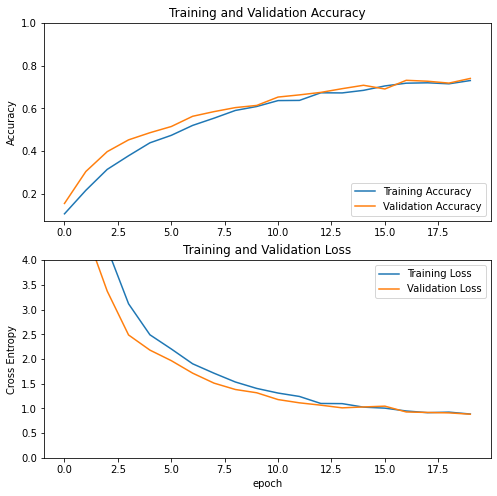

In [155]:
acc = history_Net.history['accuracy']
val_acc = history_Net.history['val_accuracy']

loss = history_Net.history['loss']
val_loss = history_Net.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()), 1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0, 4.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

From the curves above we note that the validation metrics are sometimes better than the training metrics, the main factor is because layers like **tf.keras.layers.BatchNormalization** and **tf.keras.layers.Dropout** affect accuracy during training. They are turned off when calculating validation loss.

To a lesser extent, it is also because training metrics report the average for an epoch, while validation metrics are evaluated after the epoch, so validation metrics see a model that has trained slightly longer.

### Fine tuning MobileNetV2

In the feature extraction experiment, we were only training a few layers on top of an MobileNetV2 base model. The weights of the pre-trained network were not updated during training.

One way to increase performance even further is to train (or "fine-tune") the weights of the top layers of the pre-trained model alongside the training of the classifier we added. The training process will force the weights to be tuned from generic feature maps to features associated specifically with the dataset.

In [156]:
base_model.trainable = True

We need to unfreeze the base_model and set the bottom layers to be un-trainable. Then, we recompile the model, and resume training.

In [157]:
# Let's take a look to see how many layers are in the base model
print('Number of layers in the base model: ', len(base_model.layers))

Number of layers in the base model:  154


In [158]:
# Fine-tune from this layer onwards
fine_tune_at = 100

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

### Compile the model

As we are training a much larger model and want to readapt the pretrained weights, it is important to use a lower learning rate at this stage. Otherwise, our model could overfit very quickly.

In [159]:
model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              optimizer = tf.keras.optimizers.Adam(learning_rate=best_hps.get('learning_rate')/10),
              metrics=['accuracy'])

In [160]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 sequential_3 (Sequential)   (None, 160, 160, 3)       0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 160, 160, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 160, 160, 3)      0         
 bda)                                                            
                                                                 
 mobilenetv2_1.00_160 (Funct  (None, 5, 5, 1280)       2257984   
 ional)                                                          
                                                             

In [161]:
len(model.trainable_variables)

56

In [162]:
fine_tune_epochs = 20
total_epochs = initial_epochs + fine_tune_epochs

history_fine = model.fit(train_ds, epochs=total_epochs,
                         initial_epoch=history_Net.epoch[-1],
                         validation_data=val_ds)

Epoch 20/40
107/107 [==============================] - 141s 1s/step - loss: 0.8185 - accuracy: 0.7506 - val_loss: 0.8886 - val_accuracy: 0.7326
Epoch 21/40
107/107 [==============================] - 130s 1s/step - loss: 0.7054 - accuracy: 0.7765 - val_loss: 0.8108 - val_accuracy: 0.7413
Epoch 22/40
107/107 [==============================] - 134s 1s/step - loss: 0.6678 - accuracy: 0.7853 - val_loss: 0.7334 - val_accuracy: 0.7791
Epoch 23/40
107/107 [==============================] - 130s 1s/step - loss: 0.6366 - accuracy: 0.8004 - val_loss: 0.7378 - val_accuracy: 0.7529
Epoch 24/40
107/107 [==============================] - 131s 1s/step - loss: 0.5883 - accuracy: 0.8027 - val_loss: 0.7002 - val_accuracy: 0.7689
Epoch 25/40
107/107 [==============================] - 130s 1s/step - loss: 0.5691 - accuracy: 0.8101 - val_loss: 0.6625 - val_accuracy: 0.7660
Epoch 26/40
107/107 [==============================] - 134s 1s/step - loss: 0.5204 - accuracy: 0.8295 - val_loss: 0.6542 - val_accuracy:

### Visualize training results

In [163]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

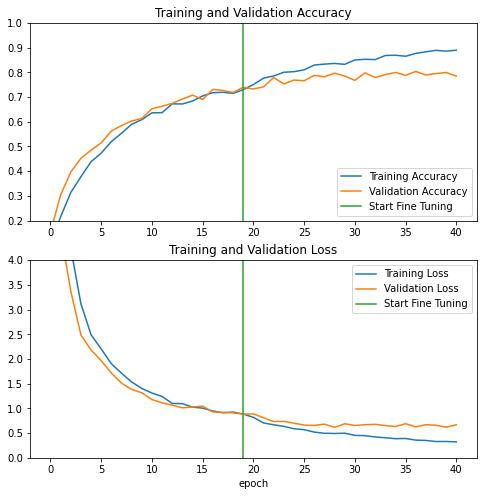

In [164]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.2, 1])
plt.plot([initial_epochs - 1, initial_epochs - 1], plt.ylim(),
         label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 4.0])
plt.plot([initial_epochs - 1, initial_epochs - 1], plt.ylim(),
         label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

### Evaluation and prediction

In [165]:
(loss, accuracy) = model.evaluate(test_ds)
print('Test accuracy :', accuracy)

5/5 [==============================] - 4s 671ms/step - loss: 0.6291 - accuracy: 0.8000
Test accuracy : 0.800000011920929


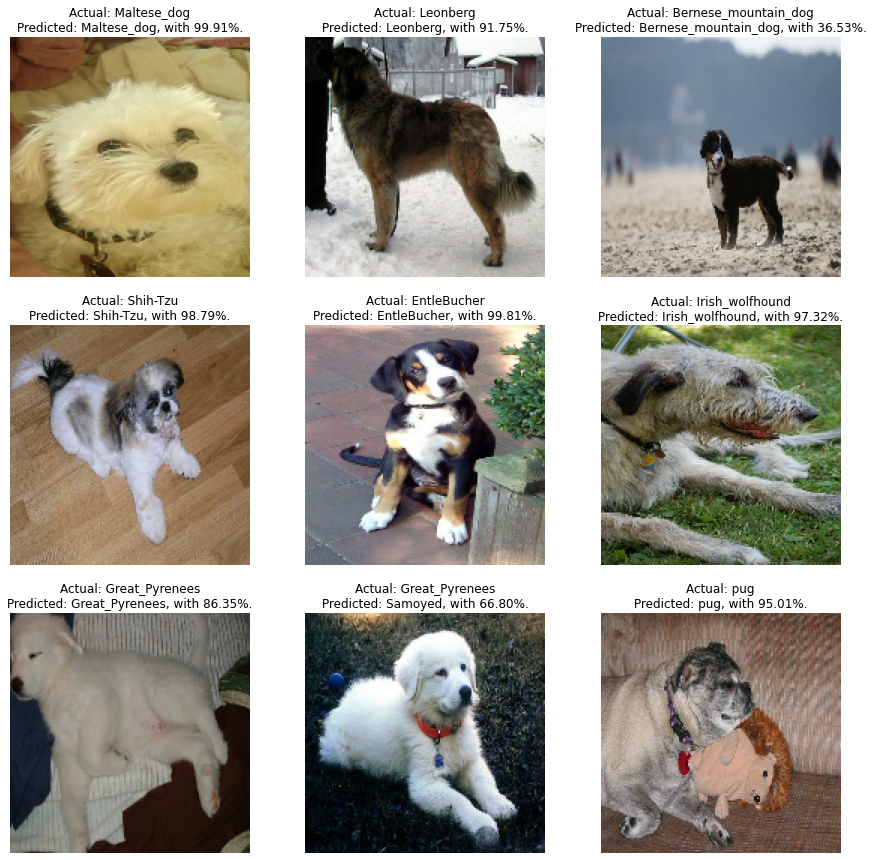

In [166]:
# Retrieve a batch of images from the test set
(image_batch, label_batch) = test_ds.as_numpy_iterator().next()
predictions = model.predict_on_batch(image_batch)

# Apply a softmax
score = tf.nn.softmax(predictions)

for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image_batch[i].astype('uint8'))
    plt.title('Actual: {}\nPredicted: {}, with {:.2f}%.'.format(class_names[label_batch[i]],
              class_names[np.argmax(score[i])], 100 * np.max(score[i])))
    plt.axis('off')

### Confusion Matrix

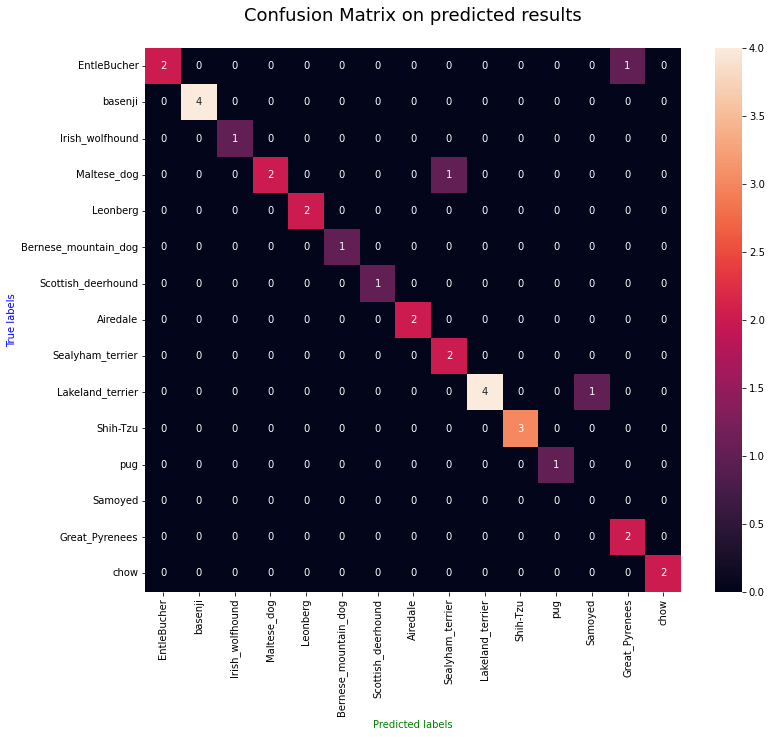

In [167]:
label = [class_names[i] for i in list(set(label_batch))]

y_test = [class_names[label_batch[i]] for i in range(len(label_batch))]
y_pred = [class_names[np.argmax(score[i])] for i in
          range(len(label_batch))]
label = list(set(y_pred + y_test))  # [class_names[i] for i in list(set(y_test))]
cf_matrix = confusion_matrix(y_test, y_pred)

fig = plt.figure(figsize=(12, 10))
ax = sns.heatmap(cf_matrix, annot=True)
ax.set_xlabel('Predicted labels', color='g')
ax.set_ylabel('True labels', color='blue')
ax.xaxis.set_ticklabels(label, rotation='vertical')
ax.yaxis.set_ticklabels(label, rotation='horizontal')
plt.title('Confusion Matrix on predicted results\n', fontsize=18)
plt.show()

In [168]:
# Save the last model
history_fine.model.save('mobilenetv2_model.h5')
print("Last model saved")

Last model saved


### 5.2.2 VGG16 model

VGG16 is object detection and classification algorithm which is able to classify 1000 images of 1000 different categories with 92.7% accuracy. It is one of the popular algorithms for image classification, we will use it with transfer learning.

### VGG16 Architecture

Let’s take the VGG16 network trained on the ImageNet dataset as an example. Let’s see its architecture:

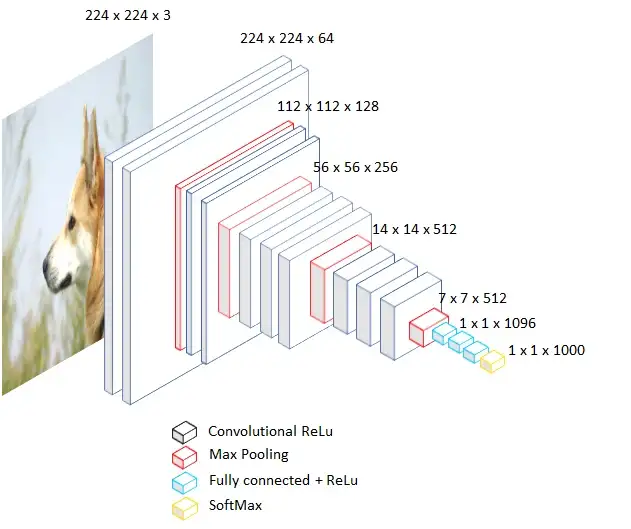

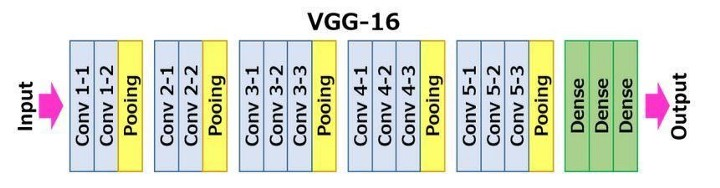

### Import the VGG16 model

In [169]:
from tensorflow.keras.applications import VGG16
vgg_base = VGG16(weights='imagenet',    # use weights for ImageNet
                 include_top=False,     # drop the Dense layers!
                 input_shape=(img_height, img_width, 3))

### Data preprocessing

In [170]:
preprocess_input = tf.keras.applications.vgg16.preprocess_input

In [171]:
(image_batch, label_batch) = next(iter(train_ds))
feature_batch = vgg_base(image_batch)
print(feature_batch.shape)

(32, 5, 5, 512)


In [172]:
vgg_base.trainable = False

In [173]:
# Let's take a look at the base model architecture
vgg_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 160, 160, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 160, 160, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 80, 80, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 80, 80, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 80, 80, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 40, 40, 128)       0     

In [174]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [175]:
prediction_layer = tf.keras.layers.Dense(num_classes)
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 20)


In [176]:
inputs = tf.keras.Input(shape=(img_height, img_width, 3))
x = data_augmentation(inputs, training=True)
x = preprocess_input(x)
x = vgg_base(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

In [177]:
base_learning_rate = best_hps.get('learning_rate')
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [178]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 sequential_3 (Sequential)   (None, 160, 160, 3)       0         
                                                                 
 tf.__operators__.getitem (S  (None, 160, 160, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 160, 160, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                      

In [179]:
len(model.trainable_variables)

2

In [180]:
initial_epochs = 20
history_vgg = model.fit(train_ds, epochs=initial_epochs,
                        validation_data=val_ds)

Epoch 1/20
107/107 [==============================] - 622s 6s/step - loss: 15.3869 - accuracy: 0.0551 - val_loss: 11.8234 - val_accuracy: 0.0523
Epoch 2/20
107/107 [==============================] - 691s 6s/step - loss: 12.7623 - accuracy: 0.0801 - val_loss: 9.6720 - val_accuracy: 0.1032
Epoch 3/20
107/107 [==============================] - 755s 7s/step - loss: 11.1759 - accuracy: 0.1010 - val_loss: 7.8701 - val_accuracy: 0.1381
Epoch 4/20
107/107 [==============================] - 619s 6s/step - loss: 9.7592 - accuracy: 0.1290 - val_loss: 6.9251 - val_accuracy: 0.1483
Epoch 5/20
107/107 [==============================] - 600s 6s/step - loss: 8.4873 - accuracy: 0.1637 - val_loss: 5.9745 - val_accuracy: 0.2093
Epoch 6/20
107/107 [==============================] - 607s 6s/step - loss: 7.4039 - accuracy: 0.2132 - val_loss: 5.6147 - val_accuracy: 0.2238
Epoch 7/20
107/107 [==============================] - 671s 6s/step - loss: 6.7987 - accuracy: 0.2426 - val_loss: 4.8646 - val_accuracy: 0.

### Visualize training results

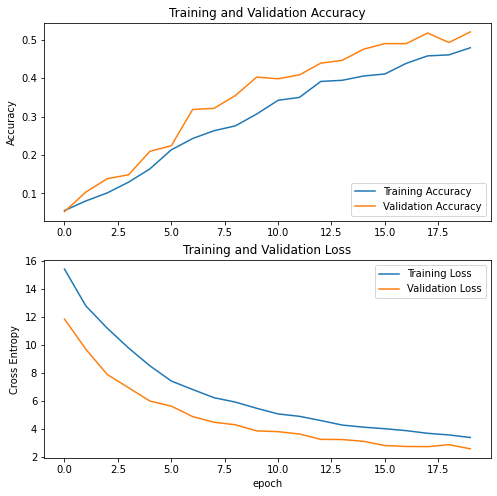

In [181]:
acc = history_vgg.history['accuracy']
val_acc = history_vgg.history['val_accuracy']

loss = history_vgg.history['loss']
val_loss = history_vgg.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
# plt.ylim([min(plt.ylim()),1])

plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
# plt.ylim([0,4.0])

plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

From the curves above we note that the validation metrics are clearly better than the training metrics, the main factor is because layers like **tf.keras.layers.BatchNormalization** and **tf.keras.layers.Dropout** affect accuracy during training. They are turned off when calculating validation loss.

To a lesser extent, it is also because training metrics report the average for an epoch, while validation metrics are evaluated after the epoch, so validation metrics see a model that has trained slightly longer.

### Fine tuning VGG16

In the feature extraction experiment, we were only training a few layers on top of an VGG16 base model. The weights of the pre-trained network were not updated during training.

One way to increase performance even further is to train (or "fine-tune") the weights of the top layers of the pre-trained model alongside the training of the classifier we added. The training process will force the weights to be tuned from generic feature maps to features associated specifically with the dataset.

In [182]:
vgg_base.trainable = True

In [183]:
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(vgg_base.layers))

Number of layers in the base model:  19


In [184]:
# Fine-tune from this layer onwards
fine_tune_at = 13

# Freeze all the layers before the `fine_tune_at` layer
for layer in vgg_base.layers[:fine_tune_at]:
    layer.trainable = False

### Compile model

In [185]:
model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              optimizer = tf.keras.optimizers.Adam(learning_rate=base_learning_rate/10),
              metrics=['accuracy'])

In [186]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 sequential_3 (Sequential)   (None, 160, 160, 3)       0         
                                                                 
 tf.__operators__.getitem (S  (None, 160, 160, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 160, 160, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                      

In [187]:
len(model.trainable_variables)

10

In [188]:
fine_tune_epochs = 20
total_epochs = initial_epochs + fine_tune_epochs

history_fine = model.fit(train_ds, epochs=total_epochs,
                         initial_epoch=history_vgg.epoch[-1],
                         validation_data=val_ds)

Epoch 20/40
107/107 [==============================] - 858s 8s/step - loss: 2.1714 - accuracy: 0.4635 - val_loss: 1.5212 - val_accuracy: 0.5436
Epoch 21/40
107/107 [==============================] - 809s 8s/step - loss: 1.5929 - accuracy: 0.5218 - val_loss: 1.3795 - val_accuracy: 0.5785
Epoch 22/40
107/107 [==============================] - 800s 7s/step - loss: 1.3759 - accuracy: 0.5713 - val_loss: 1.2689 - val_accuracy: 0.6090
Epoch 23/40
107/107 [==============================] - 799s 7s/step - loss: 1.2256 - accuracy: 0.6163 - val_loss: 1.2754 - val_accuracy: 0.5930
Epoch 24/40
107/107 [==============================] - 810s 8s/step - loss: 1.0931 - accuracy: 0.6602 - val_loss: 1.1648 - val_accuracy: 0.6250
Epoch 25/40
107/107 [==============================] - 802s 7s/step - loss: 1.0267 - accuracy: 0.6782 - val_loss: 1.0981 - val_accuracy: 0.6497
Epoch 26/40
107/107 [==============================] - 801s 7s/step - loss: 0.9445 - accuracy: 0.7035 - val_loss: 1.0782 - val_accuracy:

### Visualize training results

In [189]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

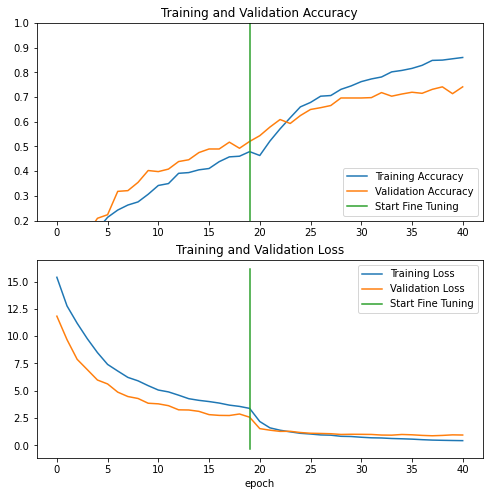

In [190]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.2, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 4.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [191]:
loss, accuracy = model.evaluate(test_ds)
print('Test accuracy :', accuracy)

5/5 [==============================] - 24s 5s/step - loss: 0.9471 - accuracy: 0.7312
Test accuracy : 0.731249988079071


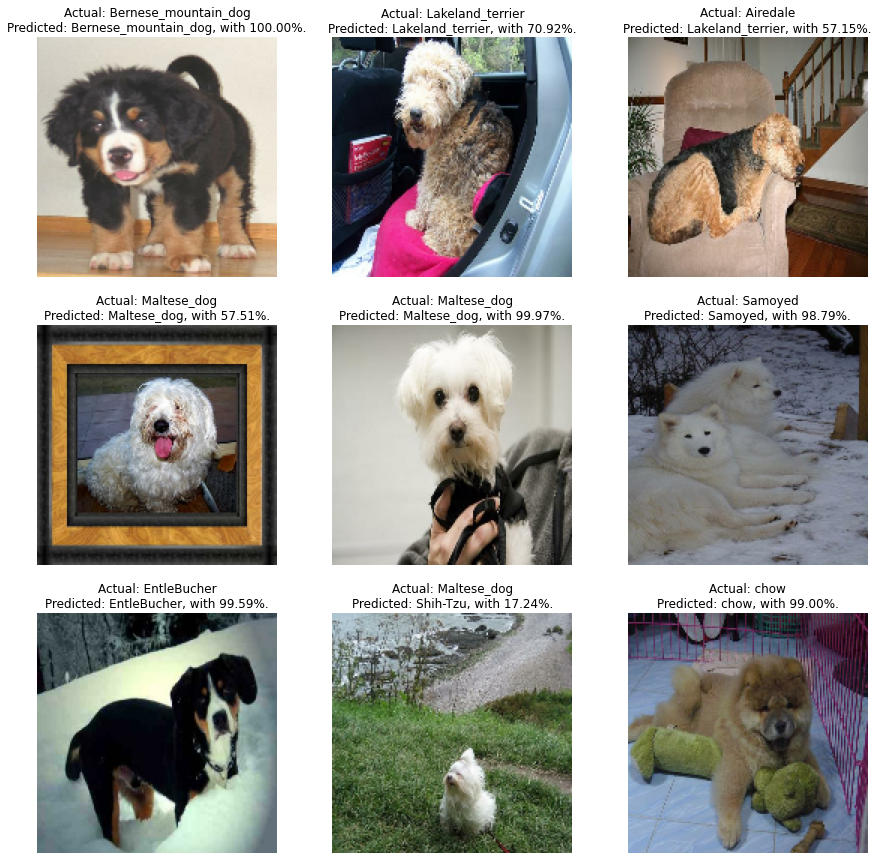

In [192]:
# Retrieve a batch of images from the test set
(image_batch, label_batch) = test_ds.as_numpy_iterator().next()
predictions = model.predict_on_batch(image_batch)

# Apply a softmax
score = tf.nn.softmax(predictions)

plt.figure(figsize=(15, 15))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image_batch[i].astype('uint8'))
    plt.title('Actual: {}\nPredicted: {}, with {:.2f}%.'.format(class_names[label_batch[i]],
              class_names[np.argmax(score[i])], 100 * np.max(score[i])))
    plt.axis('off')

### Confusion Matrix

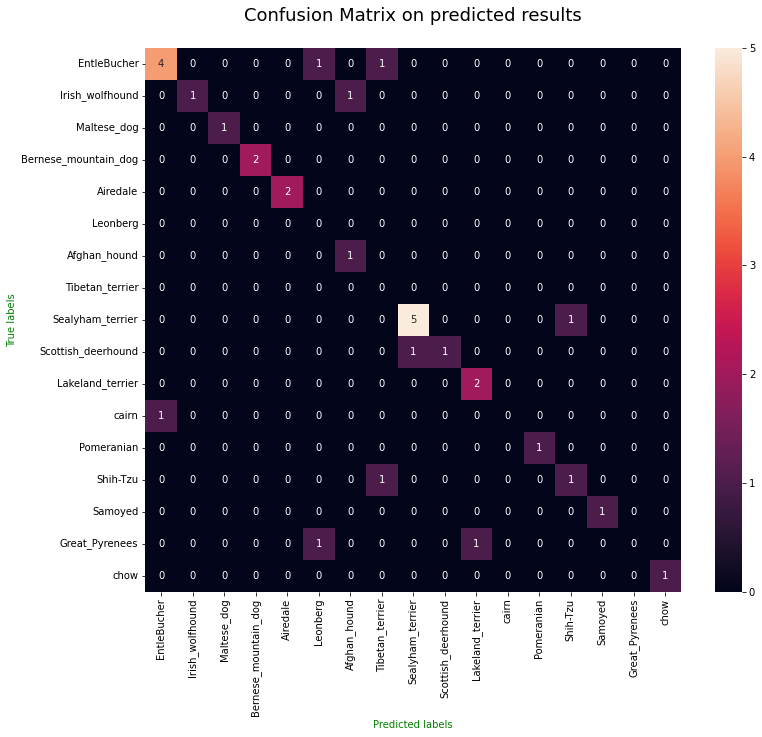

In [193]:
label = [class_names[i] for i in list(set(label_batch))]

y_test = [class_names[label_batch[i]] for i in range(len(label_batch))]
y_pred = [class_names[np.argmax(score[i])] for i in
          range(len(label_batch))]
label = list(set(y_pred + y_test))  # [class_names[i] for i in list(set(y_test))]
cf_matrix = confusion_matrix(y_test, y_pred)

fig = plt.figure(figsize=(12, 10))
ax = sns.heatmap(cf_matrix, annot=True)
ax.set_xlabel('Predicted labels', color='g')
ax.set_ylabel('True labels', color='green')
ax.xaxis.set_ticklabels(label, rotation='vertical')
ax.yaxis.set_ticklabels(label, rotation='horizontal')
plt.title('Confusion Matrix on predicted results\n', fontsize=18)
plt.show()

### Choice of the best Model

**MobileNetv2** is 32× smaller and 5× faster than **VGG16** and more accurate. **MobileNetV2** is then selected as the best model, and it will be used to predict the breed's dog.